In [1]:
import warnings
warnings.filterwarnings('ignore')

import dynamo as dyn
import numpy as np
import pandas as pd 
import seaborn as sns

import matplotlib.pyplot as plt 
import matplotlib

In [2]:
# adata = dyn.read_h5ad('./debug_simulation_jacobian.h5ad')

# adata

In [3]:
from dynamo.vectorfield.utils import vector_field_function, compute_acceleration, compute_curvature, compute_curl, compute_divergence
from dynamo.simulation.ODE import two_genes_motif, two_genes_motif_jacobian
dyn.configuration.set_pub_style()

In [4]:
adata = dyn.sim.Simulator(motif="twogenes")
adata.obsm['X_umap'], adata.obsm['velocity_umap'] = adata.X, adata.layers['velocity']
adata.obs['ntr'] = 0
adata.var['use_for_pca'] = True
adata.var['use_for_dynamics'] = True
adata.var['use_for_transition'] = True

a = np.zeros((2, 2), int)
np.fill_diagonal(a, 1)

adata.uns['PCs'] = a
# dyn.ext.ddhodge(adata, basis='umap')
adata.var['gamma'] = 1



In [5]:
# adata = dyn.read_h5ad('./debug_simulation_jacobian.h5ad')

X = adata.X
adata.obsm["X_pca"] = adata.obsm["X_umap"]
adata.obsm['velocity_pca'] = adata.obsm['velocity_umap'].copy()
adata.layers['velocity_S'] = adata.layers['velocity'].copy()
dyn.vf.VectorField(adata, basis='umap')
dyn.vf.VectorField(adata, basis='pca')
# dyn.ext.ddhodge(adata)



AnnData object with n_obs × n_vars = 5000 × 2
    obs: 'ntr', 'control_point_umap', 'inlier_prob_umap', 'obs_vf_angle_umap', 'control_point_pca', 'inlier_prob_pca', 'obs_vf_angle_pca'
    var: 'use_for_pca', 'use_for_dynamics', 'use_for_transition', 'gamma'
    uns: 'PCs', 'VecFld_umap', 'VecFld', 'VecFld_pca'
    obsm: 'X_umap', 'velocity_umap', 'X_pca', 'velocity_pca', 'velocity_umap_SparseVFC', 'X_umap_SparseVFC', 'velocity_pca_SparseVFC', 'X_pca_SparseVFC'
    layers: 'velocity', 'velocity_S'

In [6]:
%matplotlib inline

# dyn.pl.topography(adata)
# # plot potential and topography
# dyn.pl.topography(adata, color='pca_ddhodge_potential')

In [7]:
adata.uns['dynamics'] = {}
adata.uns['dynamics']["use_smoothed"] = True
adata.uns['dynamics']["has_splicing"] = True
adata.uns['dynamics']["has_labeling"] = False
adata.uns['dynamics']["NTR_vel"] = False
dyn.tl.neighbors(adata, basis='umap')
adata.uns['dynamics']["est_method"] = 'ols'
adata.var["use_for_transition"] = True
adata.uns['dynamics']['experiment_type'] = None

In [8]:
# acceleration
# curvature
# torsion
# curl
# divergence

adata.layers['M_s'], adata.layers['M_u'] = adata.X.copy(), adata.X.copy()

dyn.vf.jacobian(adata, basis='umap', regulators=['Pu.1', 'Gata.1'],
                effectors=['Pu.1', 'Gata.1'], store_in_adata=True)
dyn.vf.cell_accelerations(adata, vf_basis='umap', basis='umap', regulators=['Pu.1', 'Gata.1'],
                effectors=['Pu.1', 'Gata.1'], store_in_adata=True)
dyn.vf.cell_curvatures(adata, vf_basis='umap', basis='umap', regulators=['Pu.1', 'Gata.1'],
                effectors=['Pu.1', 'Gata.1'], store_in_adata=True)
dyn.vf.curl(adata, basis='pca')
dyn.vf.divergence(adata, basis='pca')

Calculating divergence: 100%|██████████| 5000/5000 [00:00<00:00, 11424.69it/s]


### analytical results

In [9]:
#(x, t=None, a1=1, a2=1, b1=1, b2=1, k1=1, k2=1, S=0.5, n=4)

vf = two_genes_motif

def f_jac(X):
    if X.ndim == 1: X = X.reshape((1, -1))
    J = np.zeros((X.shape[1], X.shape[1], X.shape[0]))
    for ind, i in enumerate(X):
        J[:, :, ind] = two_genes_motif_jacobian(i[0], i[1])
    return J

# set up the dictionary for the true acceleration, curvature, curl and divergence

analytical_acc = compute_acceleration(vf, f_jac, X, return_all=False)
analytical_cur = compute_curvature(vf, f_jac, X, formula=2)
analytical_curl = compute_curl(f_jac, X)
analytical_div = compute_divergence(f_jac, X, vectorize_size=1)

adata.obs['analytical_curvature'], adata.obsm['curvature_pca_true'] = analytical_cur
adata.obs['analytical_acceleration'], adata.obsm['acceleration_pca_true'] = analytical_acc
adata.obsm['X_pca_true'] = adata.obsm['X_pca'].copy()

adata.obs['analytical_curl'] = analytical_curl.copy()
adata.obs['analytical_div'] = analytical_div.copy()


# set up the dictionary for the true jacobian
J_dict = adata.uns['jacobian_umap'].copy()

J = np.zeros_like(J_dict['jacobian'])
for ind, i in enumerate(adata.X):
    J[:, :, ind] = dyn.sim.two_genes_motif_jacobian(i[0], i[1])

J_dict['jacobian'] = J
adata.uns['jacobian_true'] = J_dict
adata.obsm['X_true'] = adata.obsm['X_umap']

Calculating divergence: 100%|██████████| 5000/5000 [00:00<00:00, 20997.81it/s]


In [10]:
# plotting 

In [11]:
adata.uns['jacobian_true'].keys()

dict_keys(['jacobian', 'cell_idx', 'jacobian_gene', 'regulators', 'effectors'])

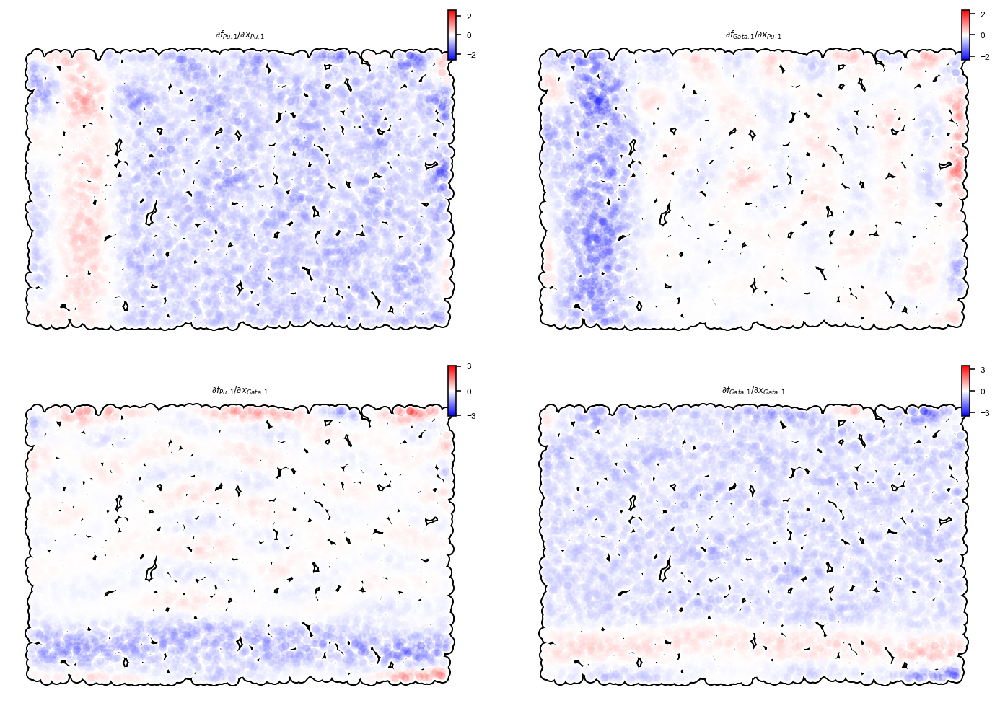

In [12]:
dyn.pl.jacobian(adata, j_basis='true')

<Figure size 600x400 with 0 Axes>

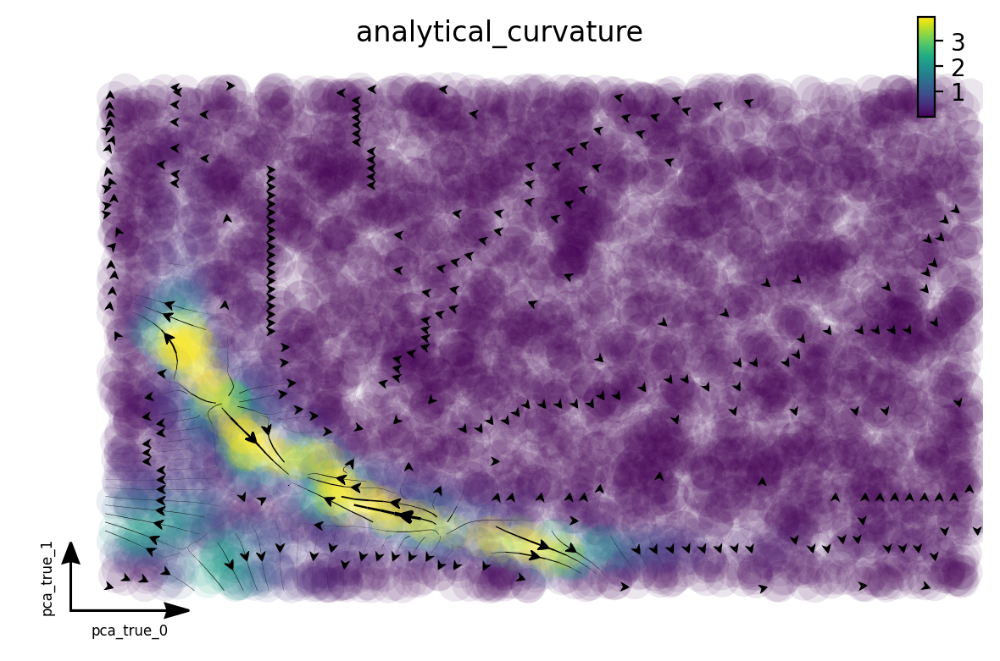

<Figure size 600x400 with 0 Axes>

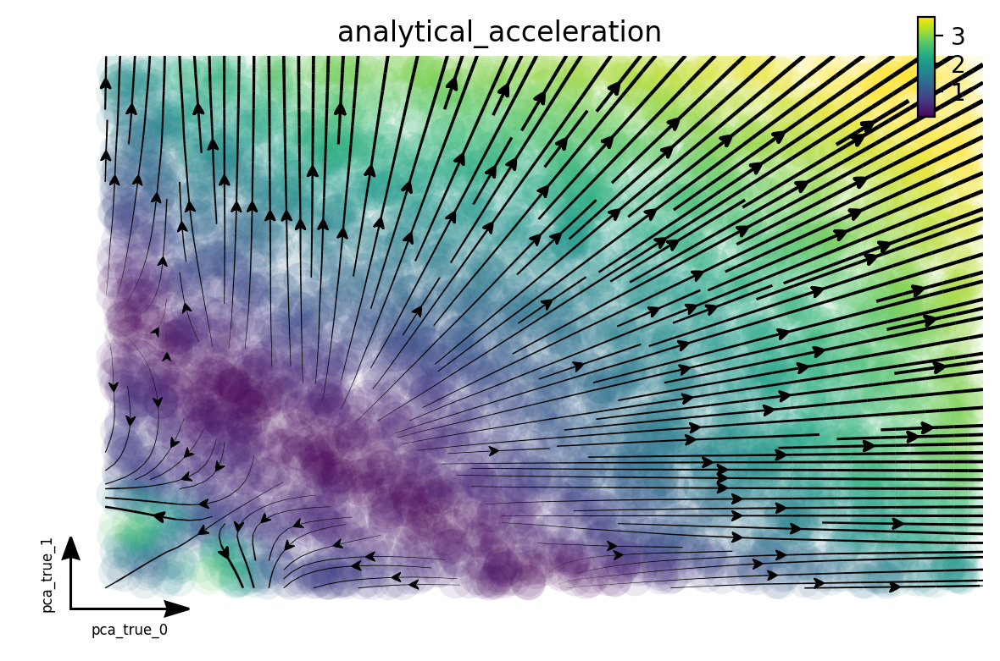

<Figure size 600x400 with 0 Axes>

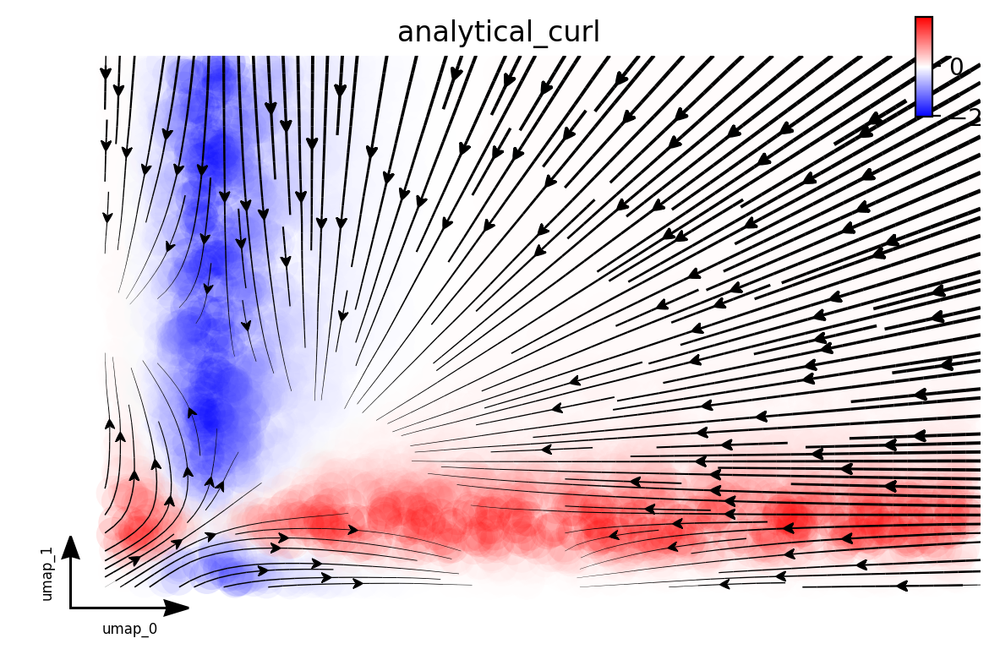

<Figure size 600x400 with 0 Axes>

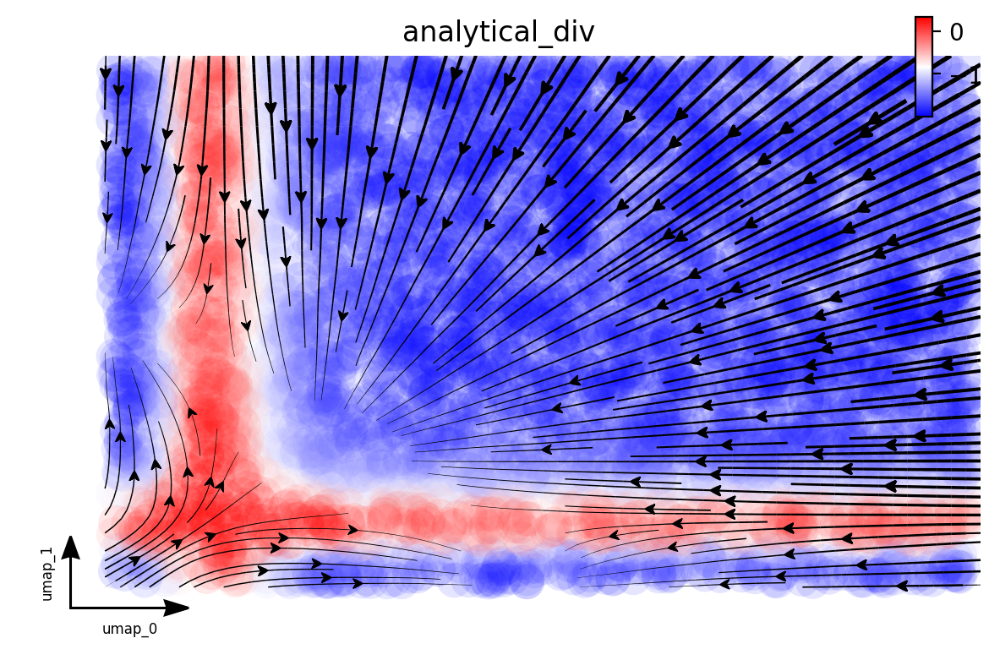

In [14]:
adata.obsm['X_pca_true'] = adata.obsm['X_pca'].copy()

dyn.pl.streamline_plot(adata, vector='curvature', basis="pca_true", color='analytical_curvature')
dyn.pl.streamline_plot(adata, vector='acceleration', basis="pca_true", color='analytical_acceleration')

dyn.pl.streamline_plot(adata, color='analytical_curl', cmap='bwr')
dyn.pl.streamline_plot(adata, color='analytical_div', cmap='bwr')


<Figure size 600x400 with 0 Axes>

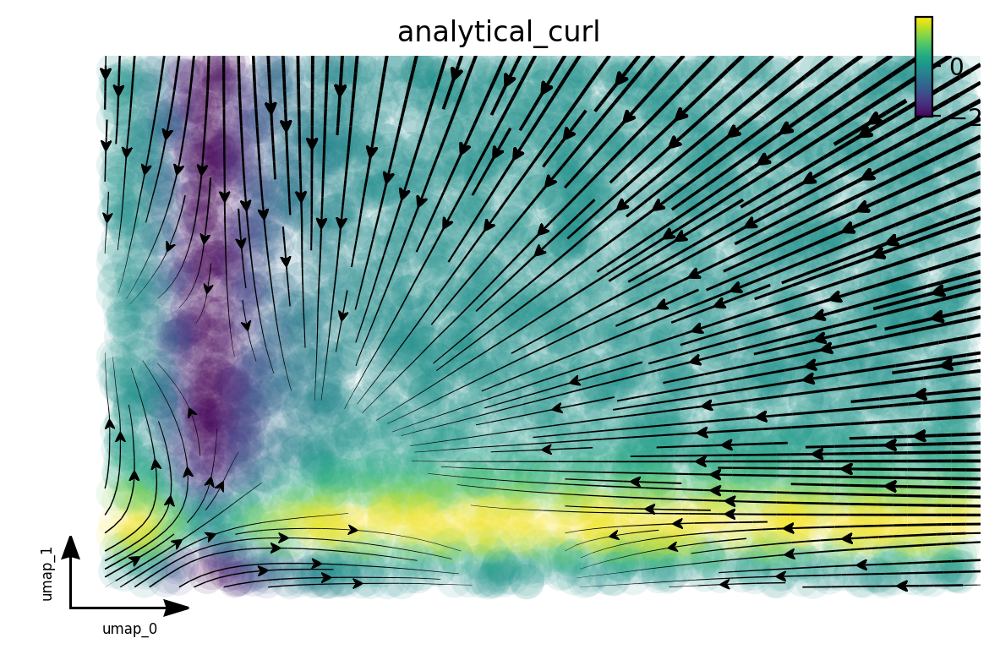

In [15]:
dyn.pl.streamline_plot(adata, color='analytical_curl')

### get analytical values on a grid 

In [16]:
vf = two_genes_motif#(x, t=None, a1=1, a2=1, b1=1, b2=1, k1=1, k2=1, S=0.5, n=4)
def f_jac(X):
    if X.ndim == 1: X = X.reshape((1, -1))
    J = np.zeros((X.shape[1], X.shape[1], X.shape[0]))
    for ind, i in enumerate(X):
        J[:, :, ind] = two_genes_motif_jacobian(i[0], i[1])
    return J

npts = 500
xmin, xmax = -0.1, 2.5
x1 = np.linspace(xmin, xmax, npts)
x2 = np.linspace(xmin, xmax, npts)

X1, X2 = np.meshgrid(x1, x2)

analytical_X = np.vstack([X1.flatten(), X2.flatten()]).T
analytical_X.shape

_analytical_curl = compute_curl(f_jac, analytical_X)
_analytical_div = compute_divergence(f_jac, analytical_X, vectorize_size=1)


Calculating divergence: 100%|██████████| 250000/250000 [00:06<00:00, 40689.46it/s]


In [17]:
# # import pandas as pd 
# from scipy.ndimage.filters import gaussian_filter
# from astropy.convolution import convolve, Gaussian1DKernel
# from astropy.convolution.kernels import Gaussian2DKernel
# import pandas as pd

# npts = 25
# xmin, xmax = -0.1, 2.5
# x1 = np.linspace(xmin, xmax, npts)
# x2 = np.linspace(xmin, xmax, npts)

# X1_25, X2_25 = np.meshgrid(x1, x2)

# analytical_X = np.vstack([X1_25.flatten(), X2_25.flatten()]).T
# analytical_X.shape
# _analytical_acc_25 = compute_acceleration(vf, f_jac, analytical_X, return_all=False)
# _analytical_cur_25 = compute_curvature(vf, f_jac, analytical_X, formula=2)

# df = _analytical_cur_25[0].reshape(npts, npts)
# df3_smooth = gaussian_filter(df, sigma=1)

# df = pd.DataFrame(df3_smooth, index = x1, columns = x2)

# import matplotlib.pyplot as plt
# import matplotlib
# f = plt.figure()

# cmap_ = matplotlib.cm.get_cmap('viridis')
# cmap_.set_bad("lightgray")
# min_cur, max_curv = _analytical_cur_25[0].min(), _analytical_cur_25[0].max()
# rgba = cmap_(_analytical_cur_25[0]/max(_analytical_cur_25[0]))
            
# plt.quiver(X1_25, X2_25, _analytical_cur_25[1][:, 0], _analytical_cur_25[1][:, 1], units='xy', 
#            scale=80, color=rgba) # , color = norm, 
# plt.contour(X1_25, X2_25, _analytical_cur_25[0].reshape(npts, npts), level=np.linspace(min_cur, max_curv, 2), colors='k', linestyles='-', alpha=0.1)
# plt.xlim([0, xmax])
# plt.ylim([0, xmax])
# plt.gca().set_aspect('equal') #, adjustable='box'
# plt.xlabel('X1')
# plt.ylabel('X2')
# plt.show()
# f.savefig("./figures/fig1_curvature.pdf")

### plot a heatmap

Calculating curvature: 100%|██████████| 250000/250000 [00:03<00:00, 62739.59it/s]


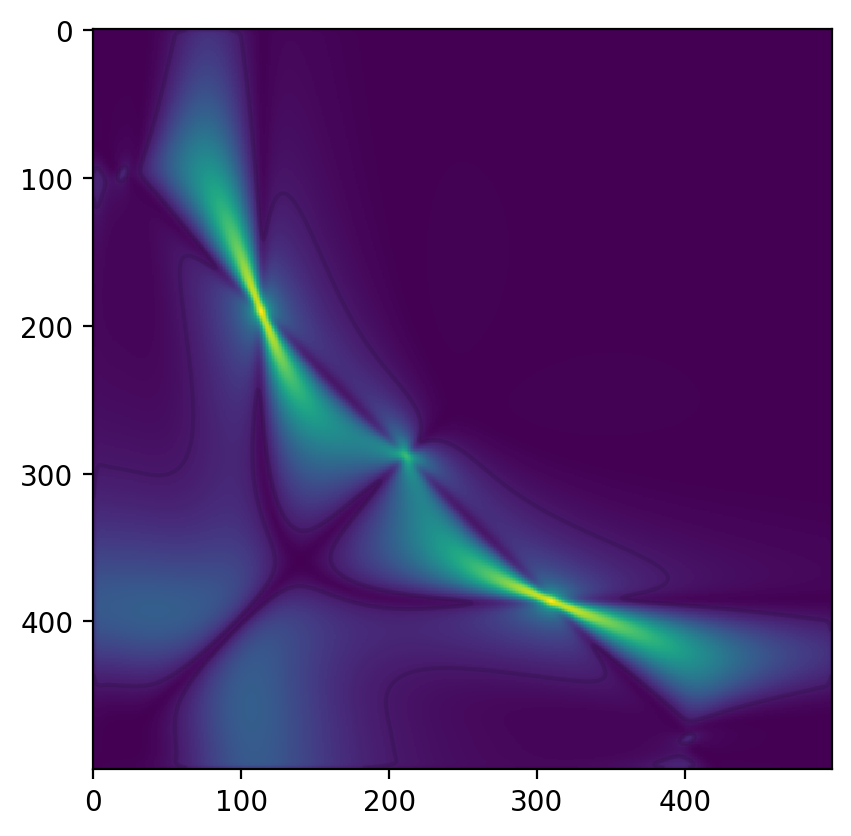

In [18]:
npts = 500
xmin, xmax = -0.1, 2.5
x1 = np.linspace(xmin, xmax, npts)
x2 = np.linspace(xmin, xmax, npts)

X1, X2 = np.meshgrid(x1, x2)

analytical_X = np.vstack([X1.flatten(), X2.flatten()]).T
analytical_X.shape
_analytical_acc = compute_acceleration(vf, f_jac, analytical_X, return_all=False)
_analytical_curv = compute_curvature(vf, f_jac, analytical_X, formula=2)


from scipy.ndimage.filters import gaussian_filter
from astropy.convolution import convolve, Gaussian1DKernel

df = _analytical_curv[0].reshape(npts, npts)
df3_smooth = gaussian_filter(df, sigma=1)

df = pd.DataFrame(df3_smooth, index = x1, columns = x2)
# sns.heatmap(df[::-1], cmap='bwr', yticklabels=False, xticklabels=False)

from astropy.convolution.kernels import Gaussian2DKernel
fig, ax = plt.subplots()
ax.imshow(convolve(np.log1p(df.values[::-1]), Gaussian2DKernel(x_stddev=2)), interpolation='none', cmap='viridis')
ax.contour(convolve(df.values[::-1], Gaussian2DKernel(x_stddev=2)), levels=[-.3, .3], colors='k', linestyles='-', alpha=0.1)
plt.savefig("./figures/fig1_smoothed_curvature.pdf")


Calculating curvature: 100%|██████████| 625/625 [00:00<00:00, 43962.50it/s]


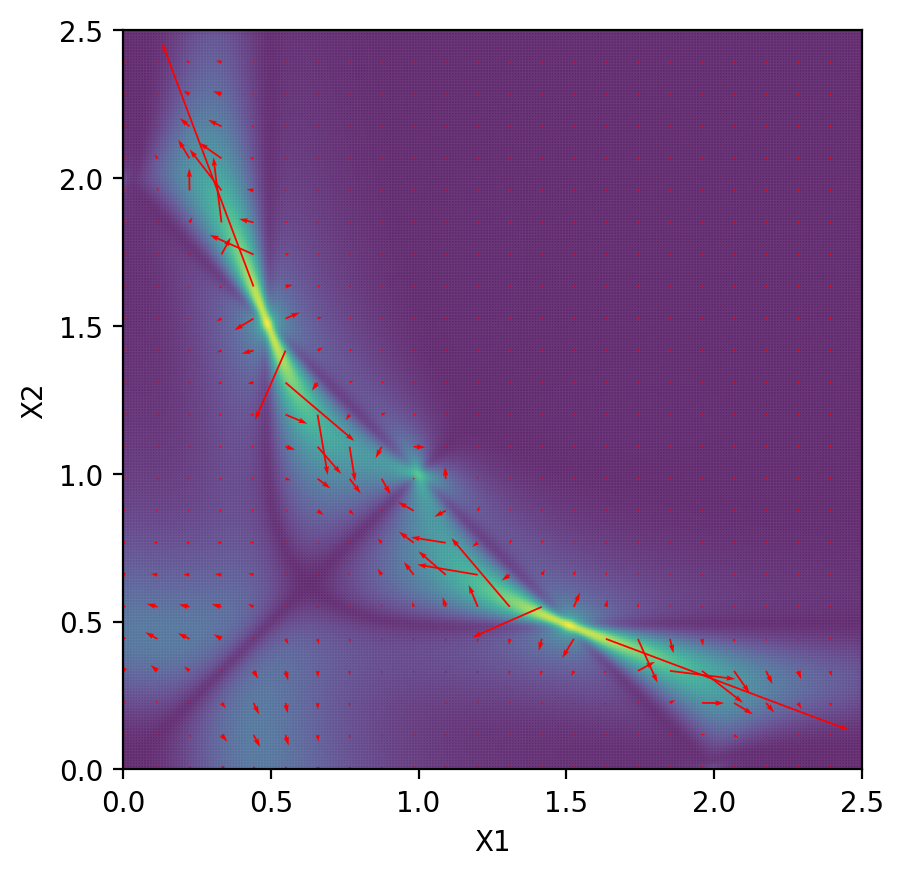

In [19]:
npts = 25
xmin, xmax = -0.1, 2.5
x1 = np.linspace(xmin, xmax, npts)
x2 = np.linspace(xmin, xmax, npts)

X1_25, X2_25 = np.meshgrid(x1, x2)

analytical_X = np.vstack([X1_25.flatten(), X2_25.flatten()]).T
analytical_X.shape
_analytical_acc_25 = compute_acceleration(vf, f_jac, analytical_X, return_all=False)
_analytical_cur_25 = compute_curvature(vf, f_jac, analytical_X, formula=2)


cmap_ = matplotlib.cm.get_cmap('viridis')
cmap_.set_bad("lightgray")

f = plt.figure()
smoothed = convolve(np.log1p(df.values), Gaussian2DKernel(x_stddev=2))
rgba = cmap_(smoothed/ np.max(smoothed))
ax = plt.scatter(X1.flatten(), X2.flatten(),s=0.1, c=smoothed, cmap='viridis', alpha=0.4) # , color = norm, 
rgba_25 = cmap_(_analytical_cur_25[0]/ max(_analytical_cur_25[0]))
plt.quiver(X1_25, X2_25, _analytical_cur_25[1][:, 0], _analytical_cur_25[1][:, 1], units='xy', 
           scale=50, color='r') # , color = norm, 
plt.xlim([0, xmax])
plt.ylim([0, xmax])
plt.gca().set_aspect('equal') #, adjustable='box'
plt.xlabel('X1')
plt.ylabel('X2')
plt.show()
f.colorbar(ax)

f.savefig("./figures/fig1_curvature.png", dpi=300)

Calculating curvature: 100%|██████████| 625/625 [00:00<00:00, 51252.05it/s]


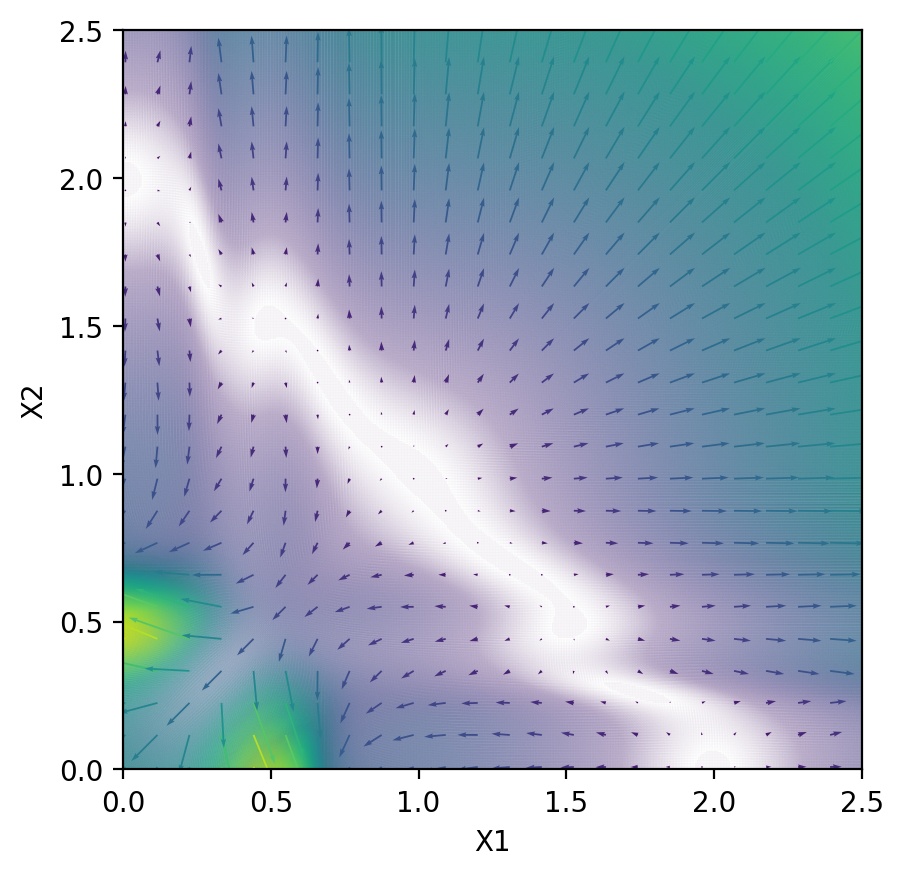

array([2.97435335e+00, 2.97435335e+00, 2.97376765e+00, ...,
       1.10544597e-03, 1.10544597e-03, 8.50228595e-04])

In [20]:
npts = 25
xmin, xmax = -0.1, 2.5
x1 = np.linspace(xmin, xmax, npts)
x2 = np.linspace(xmin, xmax, npts)

X1_25, X2_25 = np.meshgrid(x1, x2)

analytical_X = np.vstack([X1_25.flatten(), X2_25.flatten()]).T
analytical_X.shape
_analytical_acc_25 = compute_acceleration(vf, f_jac, analytical_X, return_all=False)
_analytical_cur_25 = compute_curvature(vf, f_jac, analytical_X, formula=2)

import matplotlib.pyplot as plt
f = plt.figure()
rgba = cmap_(_analytical_acc[0]/ max(_analytical_acc[0]))
ax = plt.quiver(X1, X2, _analytical_acc[1][:, 0], _analytical_acc[1][:, 1], units='xy', 
           scale=10, color=rgba, alpha=0.05) # , color = norm, 
rgba_25 = cmap_(_analytical_acc_25[0]/ max(_analytical_acc_25[0]))
plt.quiver(X1_25, X2_25, _analytical_acc_25[1][:, 0], _analytical_acc_25[1][:, 1], units='xy', 
           scale=10, color=rgba_25) # , color = norm, 
plt.xlim([0, xmax])
plt.ylim([0, xmax])
plt.gca().set_aspect('equal') #, adjustable='box'
plt.xlabel('X1')
plt.ylabel('X2')
plt.show()
f.colorbar(ax)

f.savefig("./figures/fig1_acceleration.png", dpi=300)

np.sort(_analytical_acc[0])[::-1]

Calculating curvature: 100%|██████████| 625/625 [00:00<00:00, 51830.67it/s]


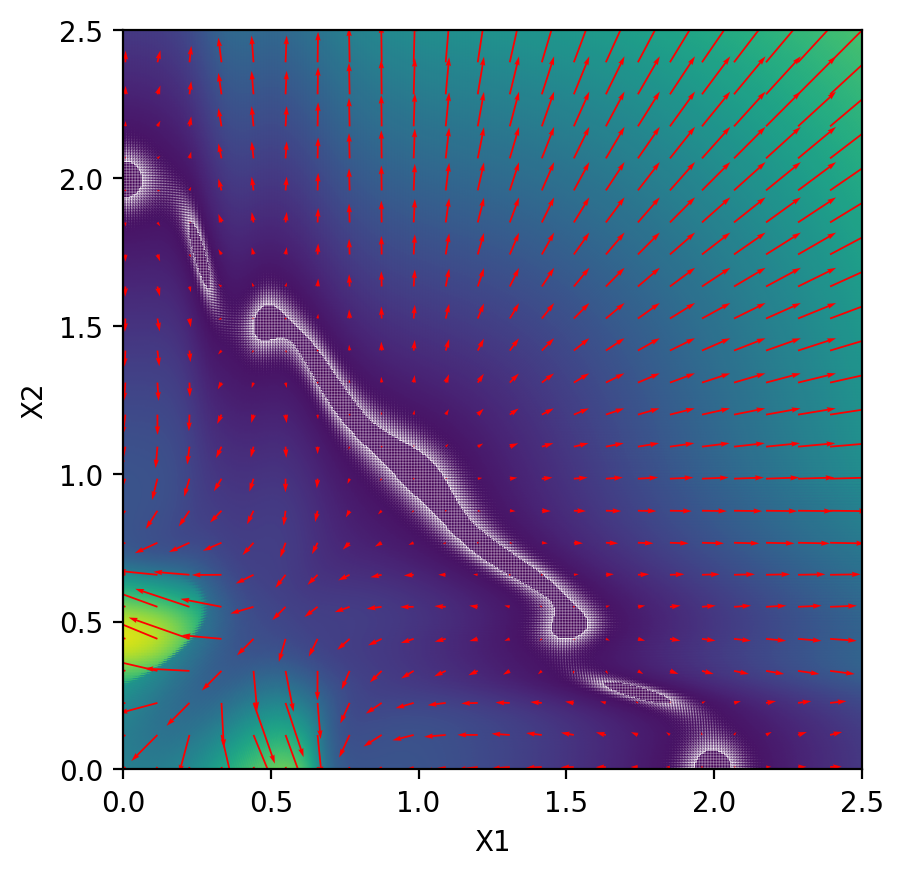

array([2.97435335e+00, 2.97435335e+00, 2.97376765e+00, ...,
       1.10544597e-03, 1.10544597e-03, 8.50228595e-04])

In [21]:
npts = 25
xmin, xmax = -0.1, 2.5
x1 = np.linspace(xmin, xmax, npts)
x2 = np.linspace(xmin, xmax, npts)

X1_25, X2_25 = np.meshgrid(x1, x2)

analytical_X = np.vstack([X1_25.flatten(), X2_25.flatten()]).T
analytical_X.shape
_analytical_acc_25 = compute_acceleration(vf, f_jac, analytical_X, return_all=False)
_analytical_cur_25 = compute_curvature(vf, f_jac, analytical_X, formula=2)

import matplotlib.pyplot as plt
f = plt.figure()
rgba = cmap_(_analytical_acc[0]/ max(_analytical_acc[0]))
ax = plt.quiver(X1, X2, _analytical_acc[1][:, 0], _analytical_acc[1][:, 1], units='xy', 
           scale=10, color=rgba, zorder=1) # , color = norm, 
rgba_25 = cmap_(_analytical_acc_25[0]/ max(_analytical_acc_25[0]))
plt.quiver(X1_25, X2_25, _analytical_acc_25[1][:, 0], _analytical_acc_25[1][:, 1], units='xy', 
           scale=10, color='r', zorder=2) # , color = norm, 
plt.xlim([0, xmax])
plt.ylim([0, xmax])
plt.gca().set_aspect('equal') #, adjustable='box'
plt.xlabel('X1')
plt.ylabel('X2')
plt.show()
f.colorbar(ax)

f.savefig("./figures/fig1_acceleration2.png", dpi=300)

np.sort(_analytical_acc[0])[::-1]

### plot a heatmap

Calculating curvature: 100%|██████████| 250000/250000 [00:03<00:00, 64220.21it/s]


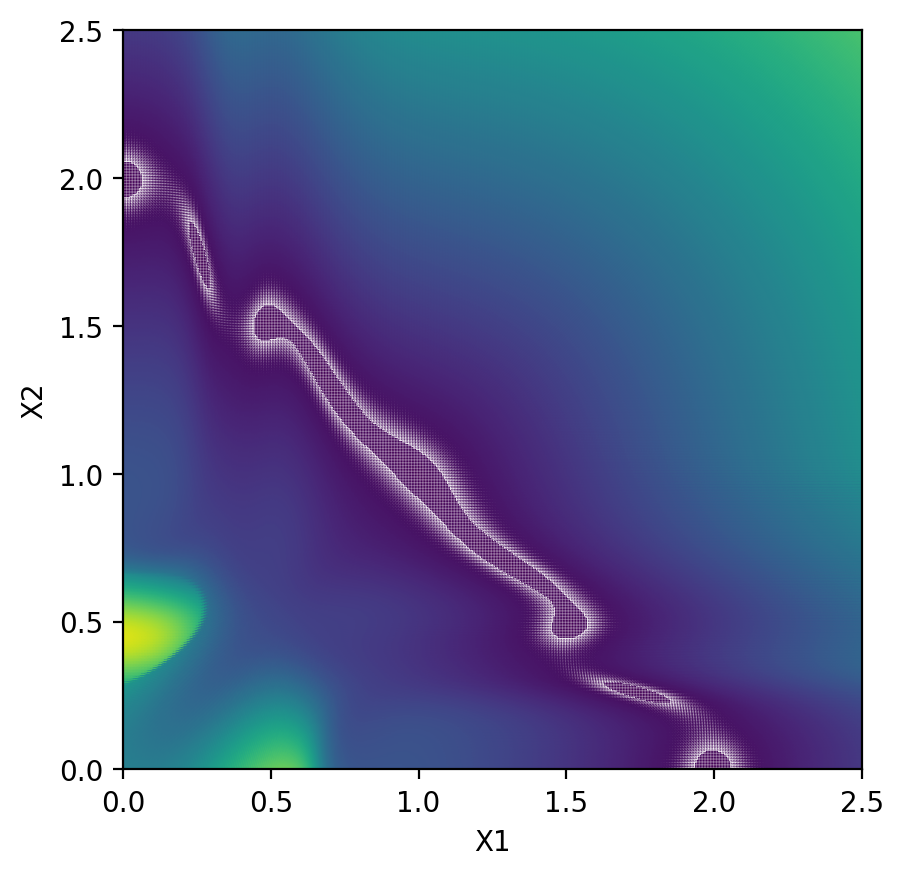

array([2.97435335e+00, 2.97435335e+00, 2.97376765e+00, ...,
       1.10544597e-03, 1.10544597e-03, 8.50228595e-04])

In [22]:
npts = 500
xmin, xmax = -0.1, 2.5
x1 = np.linspace(xmin, xmax, npts)
x2 = np.linspace(xmin, xmax, npts)

X1, X2 = np.meshgrid(x1, x2)

analytical_X = np.vstack([X1.flatten(), X2.flatten()]).T
analytical_X.shape
_analytical_acc = compute_acceleration(vf, f_jac, analytical_X, return_all=False)
_analytical_curv = compute_curvature(vf, f_jac, analytical_X, formula=2)

import matplotlib.pyplot as plt
f = plt.figure()
rgba = cmap_(_analytical_acc[0]/ max(_analytical_acc[0]))
plt.quiver(X1, X2, _analytical_acc[1][:, 0], _analytical_acc[1][:, 1], units='xy', 
           scale=10, color=rgba) # , color = norm, 
plt.xlim([0, xmax])
plt.ylim([0, xmax])
plt.gca().set_aspect('equal') #, adjustable='box'
plt.xlabel('X1')
plt.ylabel('X2')
plt.show()

f.savefig("./figures/fig1_acceleration.pdf", dpi=300)

np.sort(_analytical_acc[0])[::-1]

Calculating divergence: 100%|██████████| 250000/250000 [00:06<00:00, 40237.39it/s]


array([2.97435335e+00, 2.97435335e+00, 2.97376765e+00, ...,
       1.10544597e-03, 1.10544597e-03, 8.50228595e-04])

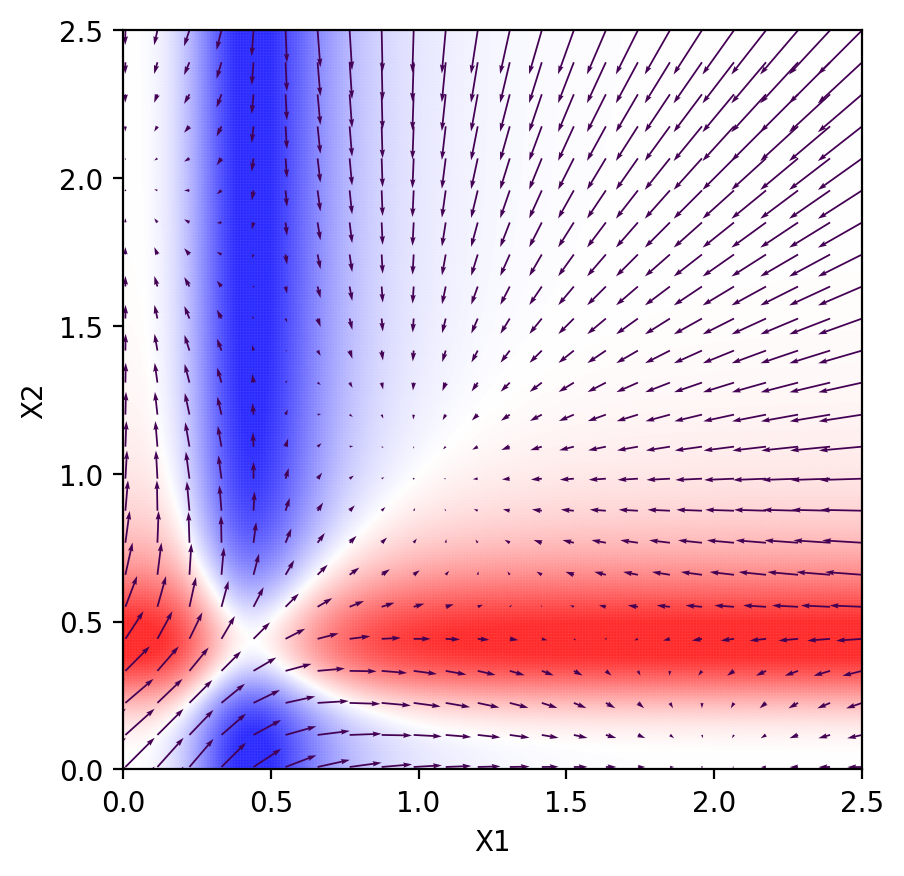

In [23]:
import pandas as pd 
from scipy.ndimage.filters import gaussian_filter
from astropy.convolution import convolve, Gaussian1DKernel

# sns.heatmap(df[::-1], cmap='bwr', yticklabels=False, xticklabels=False)

from astropy.convolution.kernels import Gaussian2DKernel

npts = 500
xmin, xmax = -0.1, 2.5
x1 = np.linspace(xmin, xmax, npts)
x2 = np.linspace(xmin, xmax, npts)

X1, X2 = np.meshgrid(x1, x2)

analytical_X = np.vstack([X1.flatten(), X2.flatten()]).T
analytical_X.shape
_analytical_curl = compute_curl(f_jac, analytical_X)
_analytical_div = compute_divergence(f_jac, analytical_X, vectorize_size=1)
df = _analytical_curl.reshape(int(np.sqrt(_analytical_curl.shape[0])), 
                              int(np.sqrt(_analytical_curl.shape[0])))
df3_smooth = gaussian_filter(df, sigma=1)

df = pd.DataFrame(df3_smooth, index = x1, columns = x2)

import matplotlib.pyplot as plt
fig, ax = plt.subplots()
rgba = cmap_(_analytical_curl/ max(_analytical_curl))
rgba = cmap_(_analytical_curl/ max(_analytical_curl))
ax.scatter(X1.flatten(), X2.flatten(),s=0.1, c=_analytical_curl, cmap='bwr', alpha=0.4, vmin=-2, vmax=2) # , color = norm, 
ax.contour(convolve(df.values[::-1], Gaussian2DKernel(x_stddev=2)), levels=[-1, 1], colors='k', linestyles='-', alpha=0.1)

npts = 25
xmin, xmax = -0.1, 2.5
x1 = np.linspace(xmin, xmax, npts)
x2 = np.linspace(xmin, xmax, npts)

X1, X2 = np.meshgrid(x1, x2)
analytical_X = np.vstack([X1.flatten(), X2.flatten()]).T
velocities = vf(analytical_X)

ax.quiver(X1, X2, velocities[:, 0], velocities[:, 1], units='xy', 
           scale=10, color=rgba) # , color = norm, 
ax.set_xlim([0, xmax])
ax.set_ylim([0, xmax])
ax.set_aspect('equal') #, adjustable='box'
ax.set_xlabel('X1')
ax.set_ylabel('X2')

f.savefig("./figures/fig1_curl_updated.png", dpi=300)

np.sort(_analytical_acc[0])[::-1]

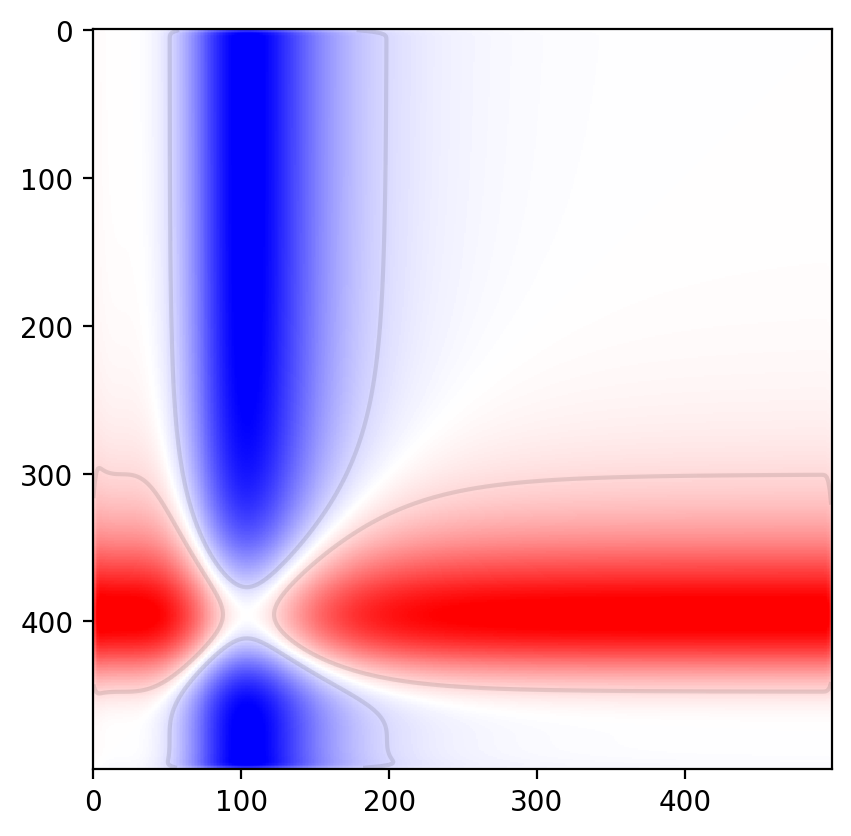

In [24]:
import pandas as pd 
from scipy.ndimage.filters import gaussian_filter
from astropy.convolution import convolve, Gaussian1DKernel

npts = 500
xmin, xmax = -0.1, 2.5
x1 = np.linspace(xmin, xmax, npts)
x2 = np.linspace(xmin, xmax, npts)
df = _analytical_curl.reshape(int(np.sqrt(_analytical_curl.shape[0])), 
                              int(np.sqrt(_analytical_curl.shape[0])))
df3_smooth = gaussian_filter(df, sigma=1)

df = pd.DataFrame(df3_smooth, index = x1, columns = x2)
# sns.heatmap(df[::-1], cmap='bwr', yticklabels=False, xticklabels=False)

from astropy.convolution.kernels import Gaussian2DKernel
fig, ax = plt.subplots()
ax.imshow(convolve(df.values[::-1], Gaussian2DKernel(x_stddev=2)), interpolation='none', cmap='bwr', vmin=-2, vmax=2)
ax.contour(convolve(df.values[::-1], Gaussian2DKernel(x_stddev=2)), levels=[-.3, .3], colors='k', linestyles='-', alpha=0.1)
plt.savefig("./figures/fig1_smoothed_curl.pdf")


Calculating divergence: 100%|██████████| 250000/250000 [00:06<00:00, 40819.77it/s]


array([2.97435335e+00, 2.97435335e+00, 2.97376765e+00, ...,
       1.10544597e-03, 1.10544597e-03, 8.50228595e-04])

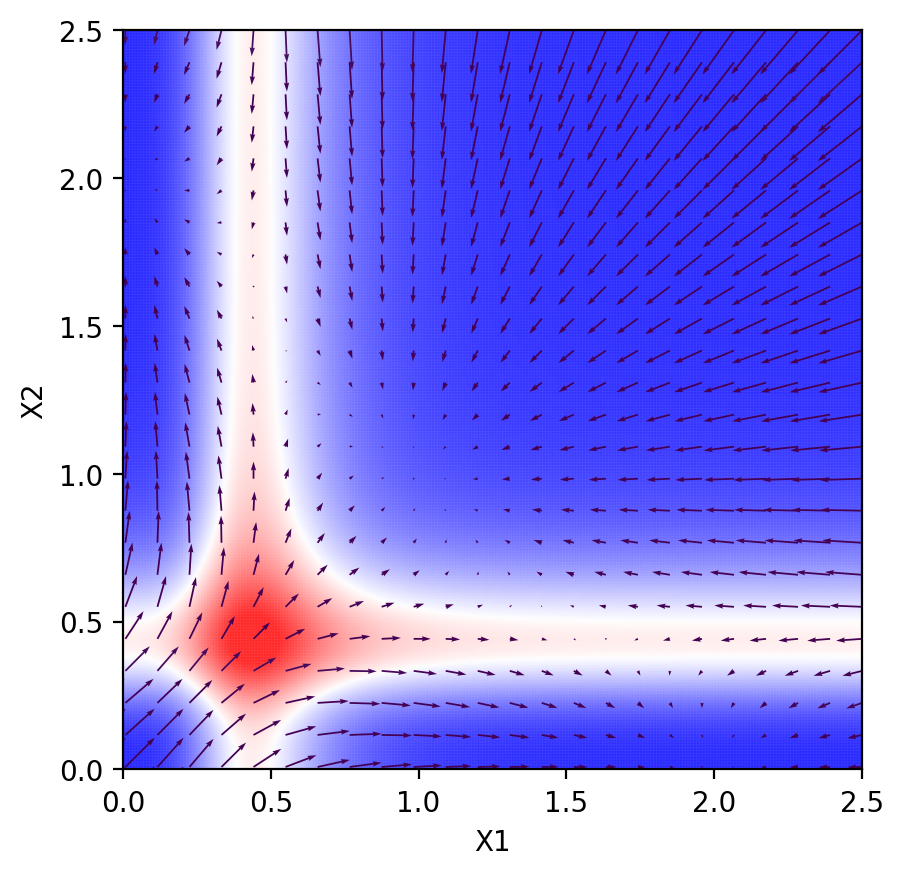

In [25]:
import pandas as pd 
from scipy.ndimage.filters import gaussian_filter
from astropy.convolution import convolve, Gaussian1DKernel

# sns.heatmap(df[::-1], cmap='bwr', yticklabels=False, xticklabels=False)

from astropy.convolution.kernels import Gaussian2DKernel

npts = 500
xmin, xmax = -0.1, 2.5
x1 = np.linspace(xmin, xmax, npts)
x2 = np.linspace(xmin, xmax, npts)

X1, X2 = np.meshgrid(x1, x2)

analytical_X = np.vstack([X1.flatten(), X2.flatten()]).T
analytical_X.shape
_analytical_curl = compute_curl(f_jac, analytical_X)
_analytical_div = compute_divergence(f_jac, analytical_X, vectorize_size=1)
df = _analytical_curl.reshape(int(np.sqrt(_analytical_div.shape[0])), 
                              int(np.sqrt(_analytical_div.shape[0])))
df3_smooth = gaussian_filter(df, sigma=1)

df = pd.DataFrame(df3_smooth, index = x1, columns = x2)

import matplotlib.pyplot as plt
fig, ax = plt.subplots()
rgba = cmap_(_analytical_div/ max(_analytical_div))
rgba = cmap_(_analytical_div/ max(_analytical_curl))
ax.scatter(X1.flatten(), X2.flatten(),s=0.1, c=_analytical_div, cmap='bwr', alpha=0.4, vmin=-2, vmax=2) # , color = norm, 
ax.contour(convolve(df.values[::-1], Gaussian2DKernel(x_stddev=2)), levels=[-1, 1], colors='k', linestyles='-', alpha=0.1)

npts = 25
xmin, xmax = -0.1, 2.5
x1 = np.linspace(xmin, xmax, npts)
x2 = np.linspace(xmin, xmax, npts)

X1, X2 = np.meshgrid(x1, x2)
analytical_X = np.vstack([X1.flatten(), X2.flatten()]).T
velocities = vf(analytical_X)

ax.quiver(X1, X2, velocities[:, 0], velocities[:, 1], units='xy', 
           scale=10, color=rgba) # , color = norm, 
ax.set_xlim([0, xmax])
ax.set_ylim([0, xmax])
ax.set_aspect('equal') #, adjustable='box'
ax.set_xlabel('X1')
ax.set_ylabel('X2')

f.savefig("./figures/fig1_divergence_updated.png", dpi=300)

np.sort(_analytical_acc[0])[::-1]

In [26]:
df = _analytical_div.reshape(int(np.sqrt(len(_analytical_div))), int(np.sqrt(len(_analytical_div))))


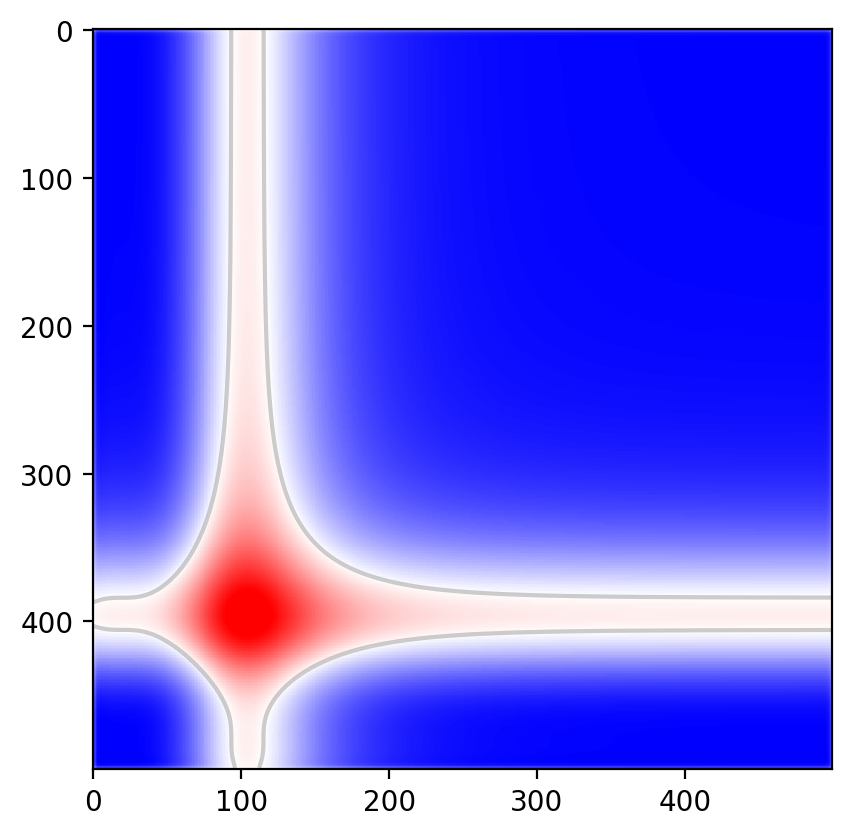

In [27]:
import pandas as pd 

npts = 500
xmin, xmax = -0.1, 2.5
x1 = np.linspace(xmin, xmax, npts)
x2 = np.linspace(xmin, xmax, npts)

X1, X2 = np.meshgrid(x1, x2)

df = _analytical_div.reshape(int(np.sqrt(len(_analytical_div))), int(np.sqrt(len(_analytical_div))))
df = pd.DataFrame(df, index = x1, columns = x2)
# sns.heatmap(df[::-1], cmap='bwr', yticklabels=False, xticklabels=False)

from astropy.convolution.kernels import Gaussian2DKernel
fig, ax = plt.subplots()
ax.imshow(convolve(df.values[::-1], Gaussian2DKernel(x_stddev=2)), interpolation='none', cmap='bwr', vmin=-2, vmax=2)
ax.contour(convolve(df.values[::-1], Gaussian2DKernel(x_stddev=2)), levels=[-.0001, .0001], colors='k', linestyles='-', alpha=0.1)
fig.savefig("./figures/fig1_smoothed_div.pdf")


### jacobian: 

In [28]:
npts = 500
xmin, xmax = -0.1, 2.5
x1 = np.linspace(xmin, xmax, npts)
x2 = np.linspace(xmin, xmax, npts)

X1, X2 = np.meshgrid(x1, x2)

analytical_X = np.vstack([X1.flatten(), X2.flatten()]).T
analytical_X.shape

J = np.zeros((2, 2, npts*npts))
for ind, i in enumerate(analytical_X):
    J[:, :, ind] = dyn.sim.two_genes_motif_jacobian(i[0], i[1])

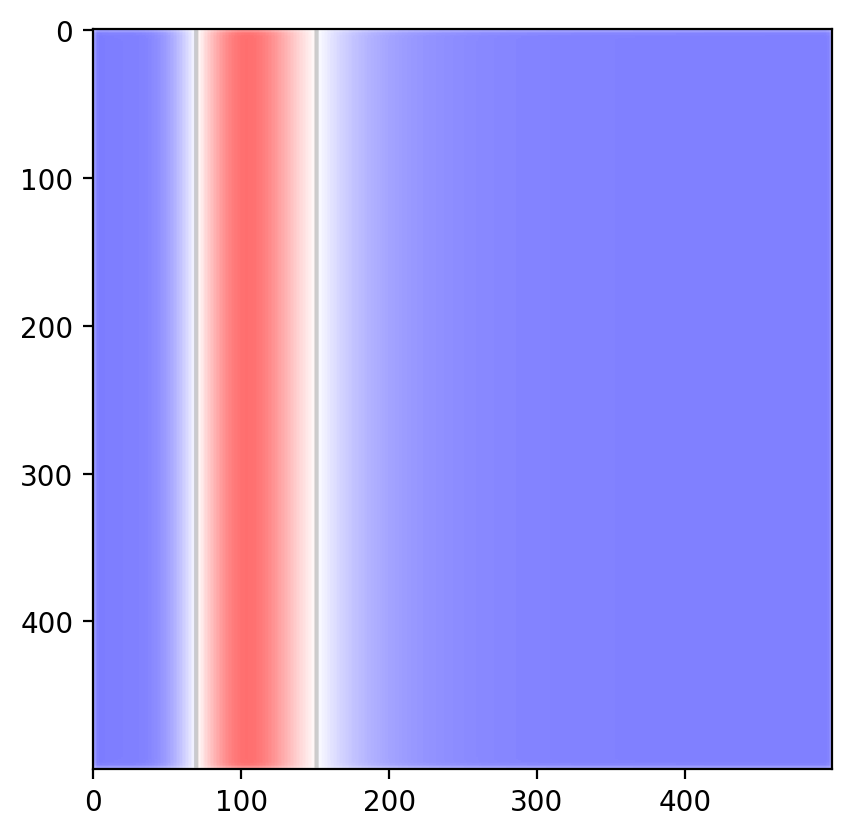

In [29]:
import pandas as pd 

df = J[0, 0, :].reshape(npts, npts)
df = pd.DataFrame(df, index = x1, columns = x2)
# sns.heatmap(df[::-1], cmap='bwr', yticklabels=False, xticklabels=False)

from astropy.convolution.kernels import Gaussian2DKernel
fig, ax = plt.subplots()
ax.imshow(convolve(df.values[::-1], Gaussian2DKernel(x_stddev=2)), interpolation='none', cmap='bwr', vmin=-2, vmax=2)
ax.contour(convolve(df.values[::-1], Gaussian2DKernel(x_stddev=2)), levels=[-.0001, .0001], colors='k', linestyles='-', alpha=0.1)
fig.savefig("./figures/fig1_smoothed_jacobain_00.pdf")


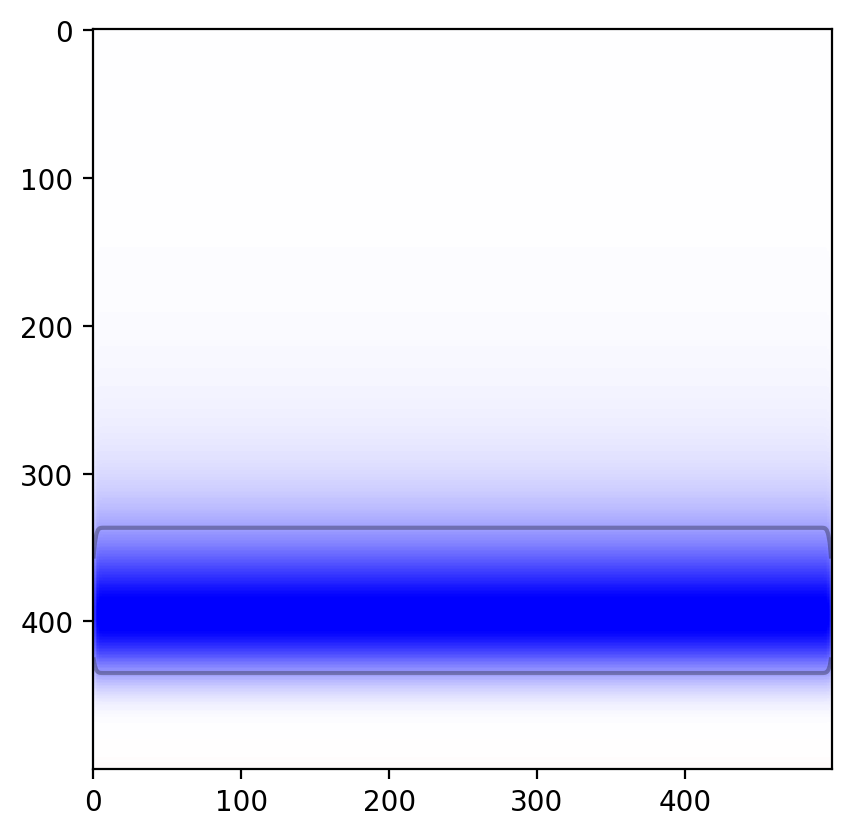

In [30]:
import pandas as pd 

df = J[0, 1, :].reshape(npts, npts)
df = pd.DataFrame(df, index = x1, columns = x2)
# sns.heatmap(df[::-1], cmap='bwr', yticklabels=False, xticklabels=False)

from astropy.convolution.kernels import Gaussian2DKernel
fig, ax = plt.subplots()
ax.imshow(convolve(df.values[::-1], Gaussian2DKernel(x_stddev=2)), interpolation='none', cmap='bwr', vmin=-2, vmax=2)
ax.contour(convolve(df.values[::-1], Gaussian2DKernel(x_stddev=2)), levels=[-.75, .75], colors='k', linestyles='-', alpha=0.3)
fig.savefig("./figures/fig1_smoothed_jacobain_01.pdf")


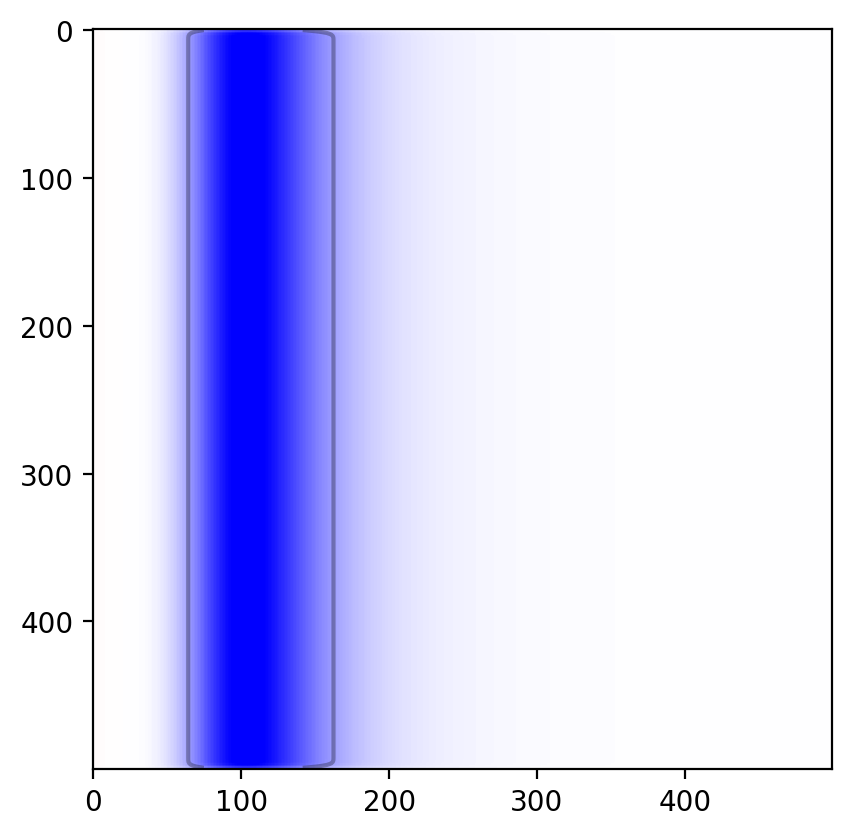

In [31]:
import pandas as pd 

df = J[1, 0, :].reshape(npts, npts)
df = pd.DataFrame(df, index = x1, columns = x2)
# sns.heatmap(df[::-1], cmap='bwr', yticklabels=False, xticklabels=False)

from astropy.convolution.kernels import Gaussian2DKernel
fig, ax = plt.subplots()
ax.imshow(convolve(df.values[::-1], Gaussian2DKernel(x_stddev=2)), interpolation='none', cmap='bwr', vmin=-2, vmax=2)
ax.contour(convolve(df.values[::-1], Gaussian2DKernel(x_stddev=2)), levels=[-.75, .75], colors='k', linestyles='-', alpha=0.3)
fig.savefig("./figures/fig1_smoothed_jacobain_10.pdf")

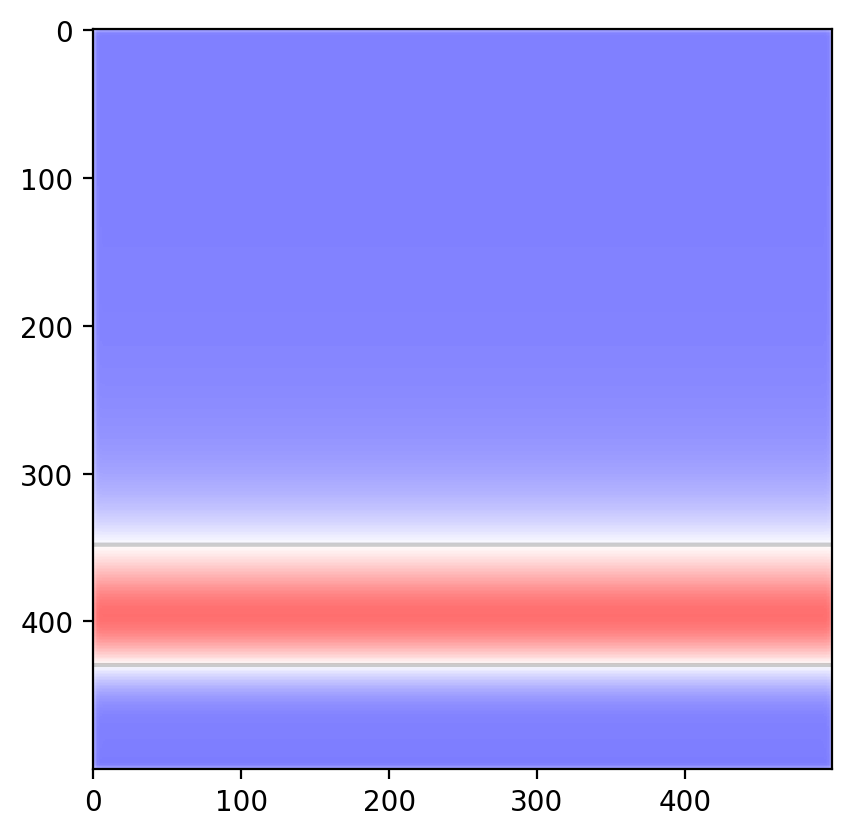

In [32]:
import pandas as pd 

df = J[1, 1, :].reshape(npts, npts)
df = pd.DataFrame(df, index = x1, columns = x2)
# sns.heatmap(df[::-1], cmap='bwr', yticklabels=False, xticklabels=False)

from astropy.convolution.kernels import Gaussian2DKernel
fig, ax = plt.subplots()
ax.imshow(convolve(df.values[::-1], Gaussian2DKernel(x_stddev=2)), interpolation='none', cmap='bwr', vmin=-2, vmax=2)
ax.contour(convolve(df.values[::-1], Gaussian2DKernel(x_stddev=2)), levels=[-.0001, .0001], colors='k', linestyles='-', alpha=0.1)
fig.savefig("./figures/fig1_smoothed_jacobain_11.pdf")

#### make line plots 

In [33]:
S = np.array([[1.0, 2.05], [1.6, 2.2], [2.1, 1.6]])
S

array([[1.  , 2.05],
       [1.6 , 2.2 ],
       [2.1 , 1.6 ]])

In [34]:
npts = 500
xmin, xmax = 0, 2.5
x2 = np.repeat(0., npts)
x1 = np.linspace(xmin, xmax, npts)

analytical_X = np.vstack([x1, x2]).T
velocities = vf(analytical_X)


In [35]:
dyn.configuration.set_pub_style(scaler=0.7)

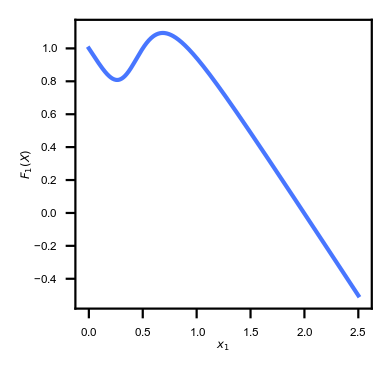

In [36]:
f = plt.figure(figsize=(1.9, 1.9))
plt.plot(x1, velocities[:, 0], lw=1.5)
# plt.xlim([0, xmax])
# plt.ylim([0, xmax])
# plt.gca().set_aspect('equal', adjustable='box') #
plt.xlabel(r'$x_1$')
plt.ylabel(r'$F_1(X)$')
# plt.gca().set_aspect('equal')
f.savefig("./figures/fig1_x_1_vs_f_1.pdf")


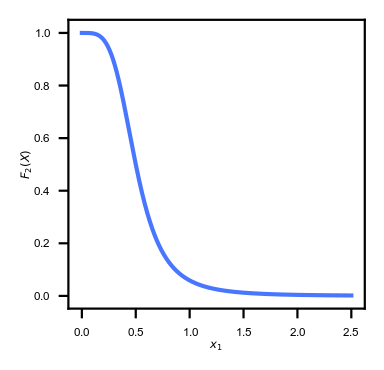

In [37]:
f = plt.figure(figsize=(1.9, 1.9))
plt.plot(x1, velocities[:, 1], lw=1.5)
# plt.xlim([0, xmax])
# plt.ylim([0, xmax])
# plt.gca().set_aspect('equal', adjustable='box') #
plt.xlabel(r'$x_1$')
plt.ylabel(r'$F_2(X)$')
# plt.gca().set_aspect('equal', adjustable='box')
f.savefig("./figures/fig1_x_1_vs_f_2.pdf")


In [38]:
npts = 500
xmin, xmax = 0, 2.5
x2 = np.repeat(0., npts)
x1 = np.linspace(xmin, xmax, npts)

analytical_X = np.vstack([x1, x2]).T

J_2 = np.zeros((2, 2, npts))
for ind, i in enumerate(analytical_X):
    J_2[:, :, ind] = dyn.sim.two_genes_motif_jacobian(i[0], i[1])

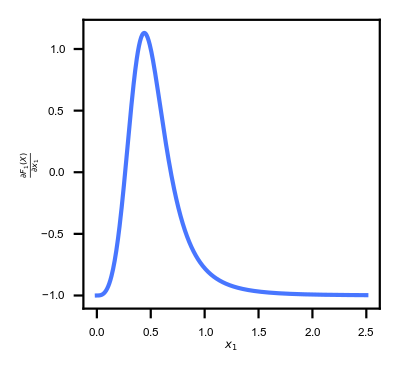

In [39]:
f = plt.figure(figsize=(1.9, 1.9))
plt.plot(x1, J_2[0, 0, :], lw=1.5)
# plt.xlim([0, xmax])
# plt.ylim([0, xmax])
# plt.gca().set_aspect('equal', adjustable='box') #
plt.xlabel(r'$x_1$')
plt.ylabel(r'$\frac{\partial F_1(X)}{\partial x_1}$')
# plt.gca().set_aspect('equal', adjustable='box')
f.savefig("./figures/fig1_x_1_vs_J_11.pdf")


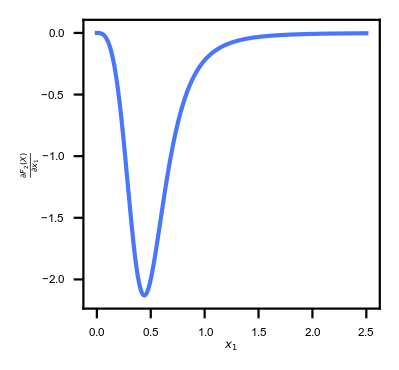

In [40]:
f = plt.figure(figsize=(1.9, 1.9))
plt.plot(x1, J_2[1, 0, :], lw=1.5)
# plt.xlim([0, xmax])
# plt.ylim([0, xmax])
# plt.gca().set_aspect('equal', adjustable='box') #
plt.xlabel(r'$x_1$')
plt.ylabel(r'$\frac{\partial F_2(X)}{\partial x_1}$')
# plt.gca().set_aspect('equal', adjustable='box')
plt.savefig("./figures/fig1_x_1_vs_J_12.pdf")


In [ ]:
import pickle 

fate_pca = pickle.load(open('./fate_pca_analytical.p', 'rb'))



In [41]:
dyn.pd.fate(adata, basis='pca', VecFld_true=two_genes_motif,
            init_cells=None, init_states=S, interpolation_num=100,  
            direction='forward',  inverse_transform=False, average=False, cores=1)


uniformly sampling points along a trajectory: 100%|██████████| 3/3 [00:00<00:00, 242.58it/s]


AnnData object with n_obs × n_vars = 5000 × 2
    obs: 'ntr', 'control_point_umap', 'inlier_prob_umap', 'obs_vf_angle_umap', 'control_point_pca', 'inlier_prob_pca', 'obs_vf_angle_pca', 'jacobian_det_umap', 'acceleration_umap', 'curvature_umap', 'curl_pca', 'divergence_pca', 'analytical_curvature', 'analytical_acceleration', 'analytical_curl', 'analytical_div'
    var: 'use_for_pca', 'use_for_dynamics', 'use_for_transition', 'gamma'
    uns: 'PCs', 'VecFld_umap', 'VecFld', 'VecFld_pca', 'dynamics', 'neighbors', 'jacobian_umap', 'jacobian_true', 'fate_pca'
    obsm: 'X_umap', 'velocity_umap', 'X_pca', 'velocity_pca', 'velocity_umap_SparseVFC', 'X_umap_SparseVFC', 'velocity_pca_SparseVFC', 'X_pca_SparseVFC', 'acceleration_umap', 'curvature_umap', 'curvature_pca_true', 'acceleration_pca_true', 'X_pca_true', 'X_true'
    layers: 'velocity', 'velocity_S', 'M_s', 'M_u'
    obsp: 'connectivities', 'distances'

In [43]:
init_states, init_cells, average, t, prediction, VecFld_true, genes  = adata.uns['fate_pca'].values()

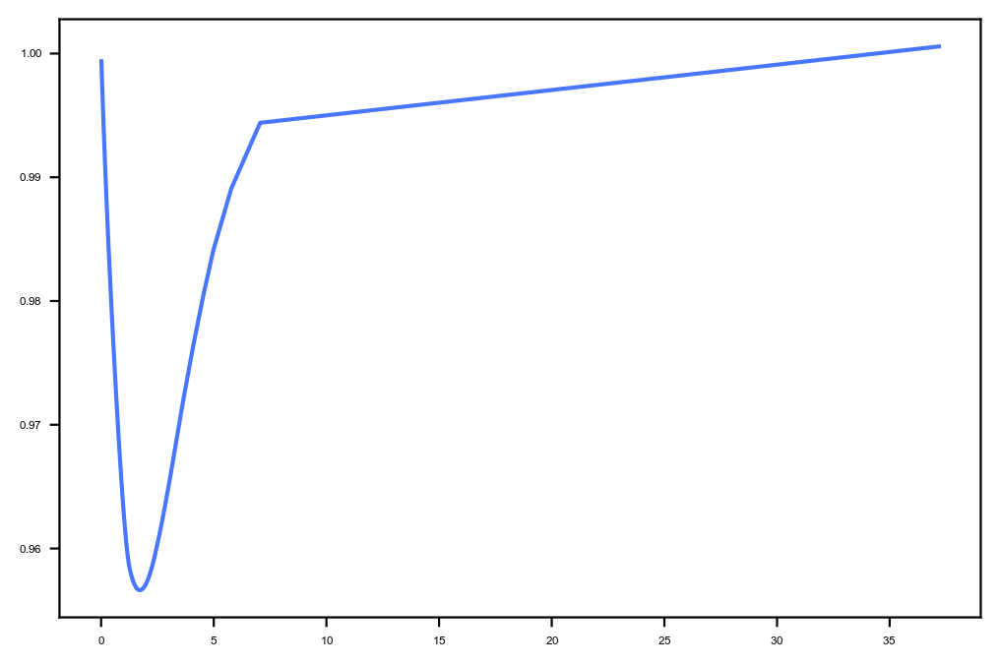

In [44]:
plt.plot(t[0], prediction[0][0])

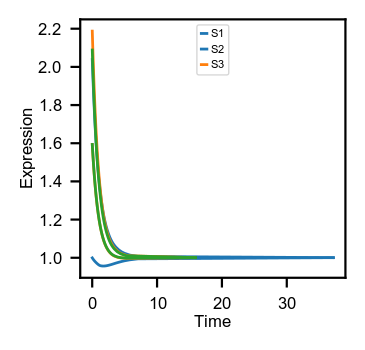

In [45]:
dyn.configuration.set_pub_style()
import matplotlib.pyplot as plt
color_cycle = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
f = plt.figure(figsize=(1.7, 1.7))
plt.plot(t[0], prediction[0][0], c=color_cycle[0], linewidth=1)
plt.plot(t[0], prediction[0][1], c=color_cycle[0], linewidth=1)

plt.plot(t[1], prediction[1][0], c=color_cycle[1], linewidth=1)
plt.plot(t[1], prediction[1][1], c=color_cycle[1], linewidth=1)

plt.plot(t[2], prediction[2][0], c=color_cycle[2], linewidth=1)
plt.plot(t[2], prediction[2][1], c=color_cycle[2], linewidth=1)

plt.legend(['S1', 'S2', 'S3'], loc='upper center')
# plt.xscale('log')
# plt.xlim([0, xmax])
# plt.ylim([0, xmax])
# plt.gca().set_aspect('equal', adjustable='box') #
plt.xlabel('Time')
plt.ylabel('Expression')
plt.show()

f.savefig("./figures/fig1_t_vs_expression.pdf")

# np.sort(_analytical_acc[0])[::-1]

In [46]:
velocity_0 = vf(prediction[0].T).T
velocity_1 = vf(prediction[1].T).T
velocity_2 = vf(prediction[2].T).T

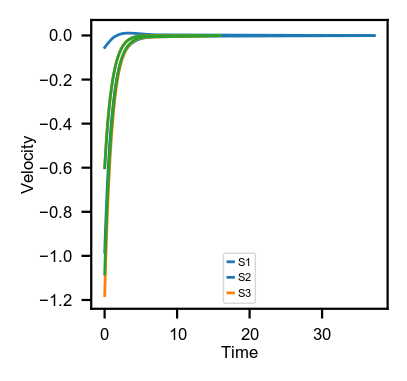

In [47]:
dyn.configuration.set_pub_style()
import matplotlib.pyplot as plt
color_cycle = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
f = plt.figure(figsize=(1.9, 1.9))
plt.plot(t[0], velocity_0[0], c=color_cycle[0], linewidth=1)
plt.plot(t[0], velocity_0[1], c=color_cycle[0], linewidth=1)

plt.plot(t[1], velocity_1[0], c=color_cycle[1], linewidth=1)
plt.plot(t[1], velocity_1[1], c=color_cycle[1], linewidth=1)

plt.plot(t[2], velocity_2[0], c=color_cycle[2], linewidth=1)
plt.plot(t[2], velocity_2[1], c=color_cycle[2], linewidth=1)

plt.legend(['S1', 'S2', 'S3'], loc='lower center')
# plt.xscale('log')
# plt.xlim([0, xmax])
# plt.ylim([0, xmax])
# plt.gca().set_aspect('equal', adjustable='box') #
plt.xlabel('Time')
plt.ylabel('Velocity')
plt.show()

f.savefig("./figures/fig1_t_vs_velocity.pdf")

# np.sort(_analytical_acc[0])[::-1]

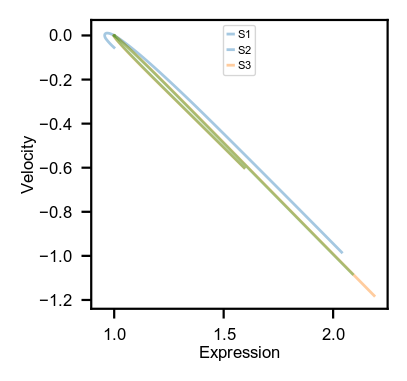

In [48]:
dyn.configuration.set_pub_style()
import matplotlib.pyplot as plt
color_cycle = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
f = plt.figure(figsize=(1.9, 1.9))
plt.plot(prediction[0][0], velocity_0[0], c=color_cycle[0], linewidth=1, alpha=0.4)
plt.plot(prediction[0][1], velocity_0[1], c=color_cycle[0], linewidth=1, alpha=0.4)

plt.plot(prediction[1][0], velocity_1[0], c=color_cycle[1], linewidth=1, alpha=0.4)
plt.plot(prediction[1][1], velocity_1[1], c=color_cycle[1], linewidth=1, alpha=0.4)

plt.plot(prediction[2][0], velocity_2[0], c=color_cycle[2], linewidth=1, alpha=0.4)
plt.plot(prediction[2][1], velocity_2[1], c=color_cycle[2], linewidth=1, alpha=0.4)

plt.legend(['S1', 'S2', 'S3'], loc='upper center')
# plt.xscale('log')
# plt.xlim([0, xmax])
# plt.ylim([0, xmax])
# plt.gca().set_aspect('equal', adjustable='box') #
plt.xlabel('Expression')
plt.ylabel('Velocity')
plt.show()

f.savefig("./figures/fig1_expression_vs_velocity.pdf")

# np.sort(_analytical_acc[0])[::-1]

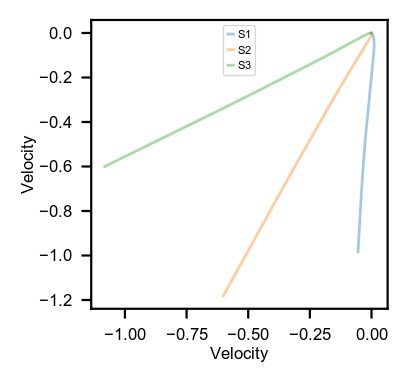

In [49]:
dyn.configuration.set_pub_style()
import matplotlib.pyplot as plt
color_cycle = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
f = plt.figure(figsize=(1.9, 1.9))
plt.plot(velocity_0[0], velocity_0[1], c=color_cycle[0], linewidth=1, alpha=0.4)

plt.plot(velocity_1[0], velocity_1[1], c=color_cycle[1], linewidth=1, alpha=0.4)

plt.plot(velocity_2[0], velocity_2[1], c=color_cycle[2], linewidth=1, alpha=0.4)

plt.legend(['S1', 'S2', 'S3'], loc='upper center')
# plt.xscale('log')
# plt.xlim([0, xmax])
# plt.ylim([0, xmax])
# plt.gca().set_aspect('equal', adjustable='box') #
plt.xlabel('Velocity')
plt.ylabel('Velocity')
plt.show()

f.savefig("./figures/fig1_velocity_vs_velocity.pdf")

# np.sort(_analytical_acc[0])[::-1]

In [50]:
dyn.ext.ddhodge(adata, basis='umap')

Constructing diffusion graph from reconstructed vector field: 5000it [02:14, 37.16it/s]


In [51]:
adata.var

,use_for_pca,use_for_dynamics,use_for_transition,gamma
gene_short_name,,,,
Pu.1,True,True,True,1
Gata.1,True,True,True,1


### debug this 

Saving figure to /lab/solexa_weissman/xqiu/proj/Aristotle/data/Fig4/./figures/Fig4_X_spliced_velocity_heatmap_dyn_savefig.pdf...
Done


<Figure size 700x400 with 0 Axes>

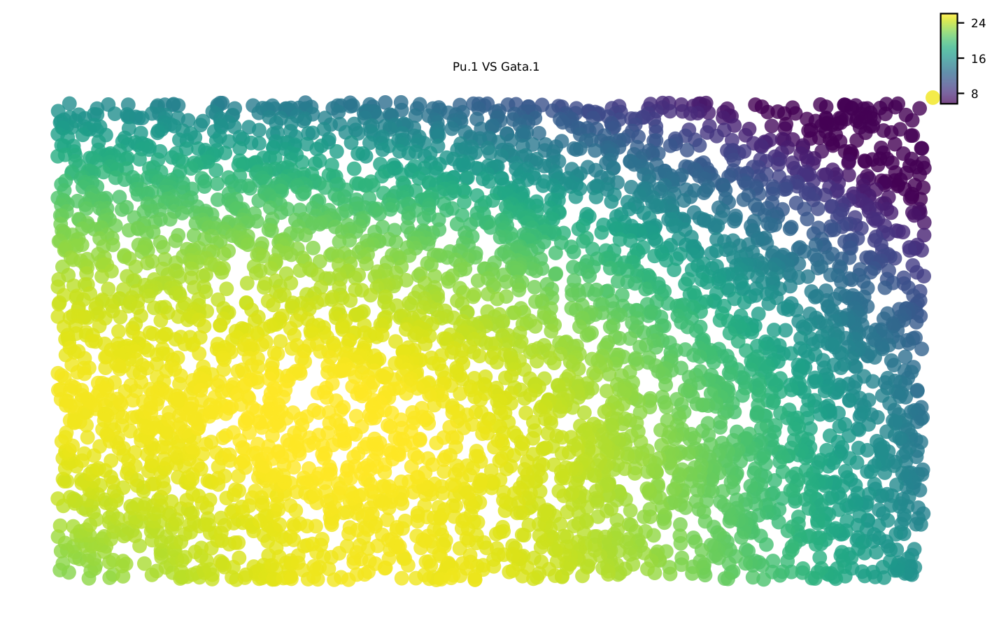

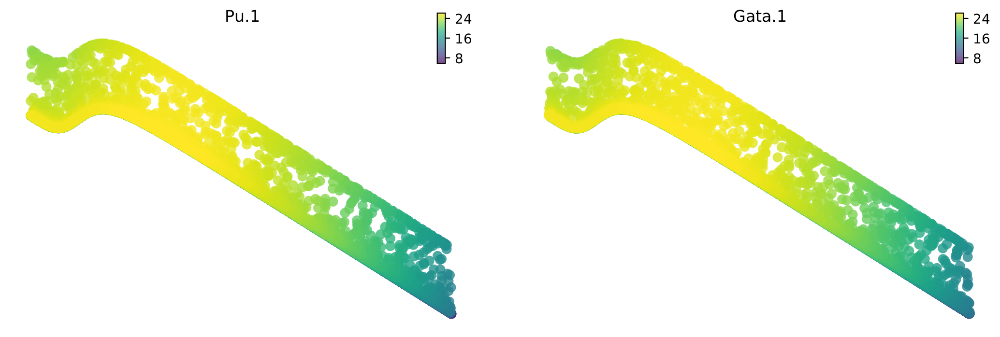

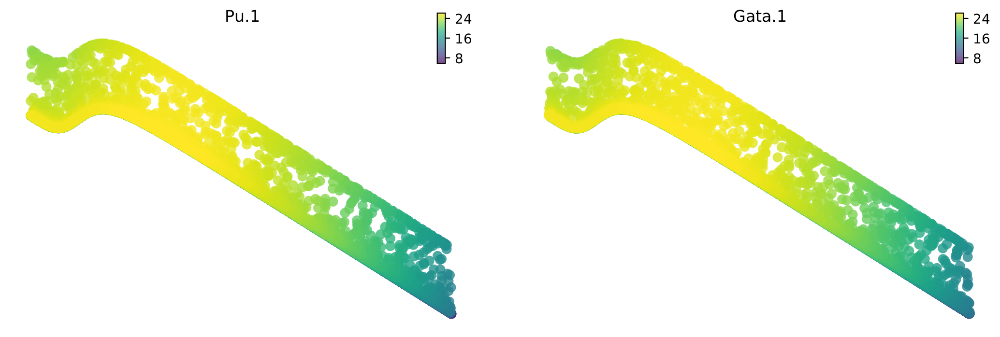

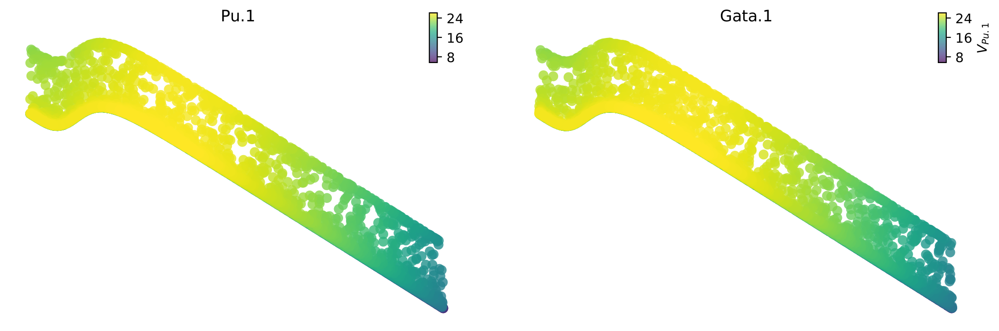

In [52]:

# compute_torsion(vf, f_jac, X)
# plot the recovered jacobian
# dyn.pl.jacobian(adata)
# #plot jacobian kinetics and heatmap
# dyn.pl.jacobian_kinetics(adata, basis='umap', tkey='umap_ddhodge_potential')
# dyn.pl.jacobian_heatmap(adata, cell_idx=[0], basis='umap')

# points issue
dyn.pl.scatters(adata, x='Pu.1', y='Gata.1', pointsize=0.25, alpha=0.8,  color='umap_ddhodge_potential',
                ncols=3, background='white', figsize=(7, 4), add_gamma_fit=False)


# import Scribe as scb
# scb.pl.viz_response(adata, np.array([['Pu.1','Gata.1']]),grid_num=25, log=False) #
# scb.pl.viz_causality(adata,np.array([['Pu.1','Gata.1']]),grid_num=25, log=False)
# scb.pl.viz_comb_logic(adata,np.array([['Isg15','Nfkb1', 'Rela']]), grid_num=10, log=False)

def good_plots():
    dyn.pl.scatters(adata, x=['Pu.1'], y=['Gata.1'], pointsize=0.05, alpha=0.8, layer=['M_s', 'M_u'], color='umap_ddhodge_potential', use_smoothed=True,
                    ncols=3, background='white', add_gamma_fit=False, save_show_or_return='save',
                       save_kwargs={'prefix': './figures/Fig4_M_s_M_u', 'ext': 'pdf',
                                     "bbox_inches": None},
                        figsize=(2, 2))

    dyn.pl.scatters(adata, x=['M_s'], y=['velocity'], pointsize=0.05, alpha=0.8, basis=['Pu.1', 'Gata.1'], color='umap_ddhodge_potential',
                    ncols=3, background='white', add_gamma_fit=False, save_show_or_return='save',
                       save_kwargs={'prefix': './figures/Fig4_M_s_velocity', 'ext': 'pdf',
                                     "bbox_inches": None},
                        figsize=(2, 2))

    dyn.pl.scatters(adata, x=np.repeat('umap_ddhodge_potential', 9), pointsize=0.05, alpha=0.8, y=adata.var_names, layer='X_spliced', color='umap_ddhodge_potential',
                ncols=3, background='white', save_show_or_return='save',
                       save_kwargs={'prefix': './figures/Fig4_potential_velocity', 'ext': 'pdf',
                                     "bbox_inches": None},
                        figsize=(2, 2))


dyn.pl.scatters(adata, x=['Pu.1'], y=['Gata.1'], pointsize=0.25, alpha=0.8, layer=['X_spliced', 'velocity'], color='umap_ddhodge_potential',
                ncols=3, background='white', save_show_or_return='save',
                       save_kwargs={'prefix': './figures/Fig4_X_spliced_velocity_heatmap', 'ext': 'pdf',
                                     "bbox_inches": None},
                        figsize=(2, 2), add_gamma_fit=False)

dyn.pl.scatters(adata, x=['M_s'], y=['velocity'], pointsize=0.25, alpha=0.8, basis=['Pu.1', 'Gata.1'], color='umap_ddhodge_potential',
                ncols=3, background='white', figsize=(7, 4), add_gamma_fit=False)
dyn.pl.scatters(adata, x=['M_s'], y=['velocity'], pointsize=0.25, alpha=0.8, basis=['Pu.1', 'Gata.1'], color='umap_ddhodge_potential',
                ncols=3, background='white', figsize=(7, 4), add_gamma_fit=False)
dyn.pl.scatters(adata, x=['M_s'], y=['velocity'], pointsize=0.25, alpha=0.8, basis=['Pu.1', 'Gata.1'], color='umap_ddhodge_potential',
                ncols=3, background='white', figsize=(7, 4), add_gamma_fit=False)

def jacobian(x1, x2):
    J = np.array([[0.25 * x1**3 / (0.0625 + x1**4)**2 - 1, -0.25 * x2**3 / (0.0625 + x2**4)**2],
                  [- 0.25 * x1**3 / (0.0625 + x1**4)**2, 0.25 * x2**3 / (0.0625 + x2**4)**2 - 1]])
    return J


# dyn.pl.scatters(adata, x='X', y='velocity', basis='Pu.1')
import seaborn as sns
import matplotlib.pyplot as plt
x, y = adata[:, 'Pu.1'].X.flatten(), adata[:, 'Gata.1'].layers['velocity'].flatten()
sns.scatterplot(x, y)
plt.xlabel(r'$X_{Pu.1}$')
plt.ylabel(r'$V_{Gata.1}$')
plt.show()

x, y = adata[:, 'Pu.1'].X.flatten(), adata[:, 'Pu.1'].layers['velocity'].flatten()
sns.scatterplot(x, y)
plt.xlabel(r'$X_{Pu.1}$')
plt.ylabel(r'$V_{Pu.1}$')
plt.show()


In [53]:
x_a = np.random.normal(0, 4, 1000)

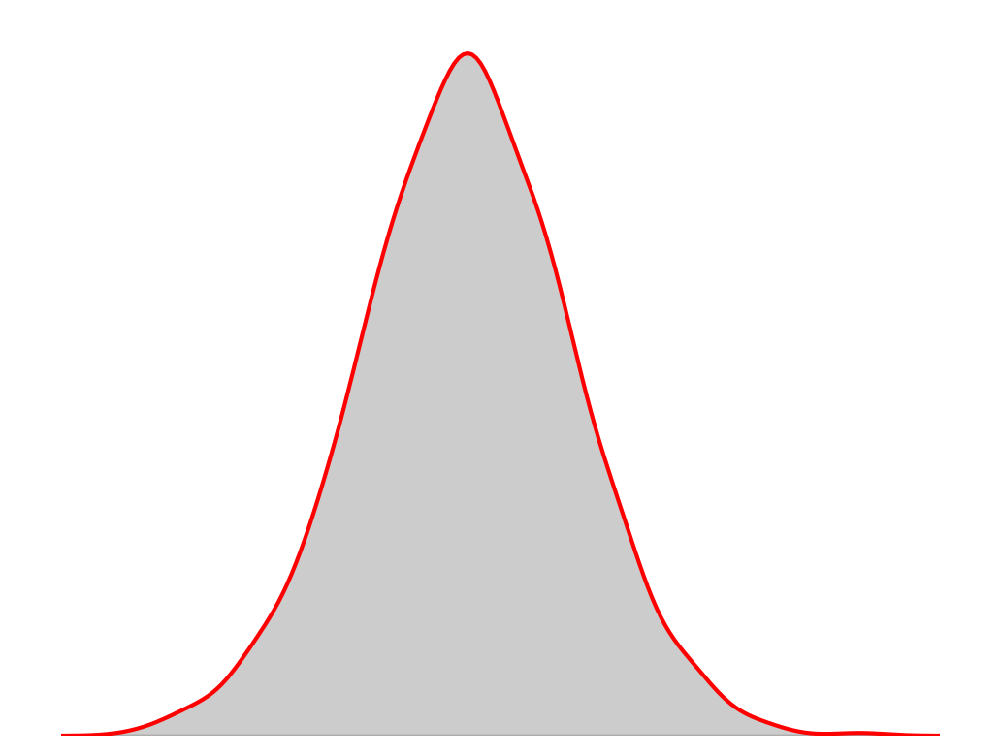

In [54]:
ax = sns.distplot(x_a, color='gray', hist=False, kde_kws={'color': 'red'})
kde_x, kde_y = ax.lines[0].get_data()


ax.fill_between(kde_x, kde_y , 
                interpolate=True, color='gray', alpha=0.4)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels('')
ax.set_yticklabels('')
ax.set_xticks([])
ax.set_yticks([])

sns.despine(left=True, bottom=True)
plt.savefig("./figures/fig_si1_b0.pdf")


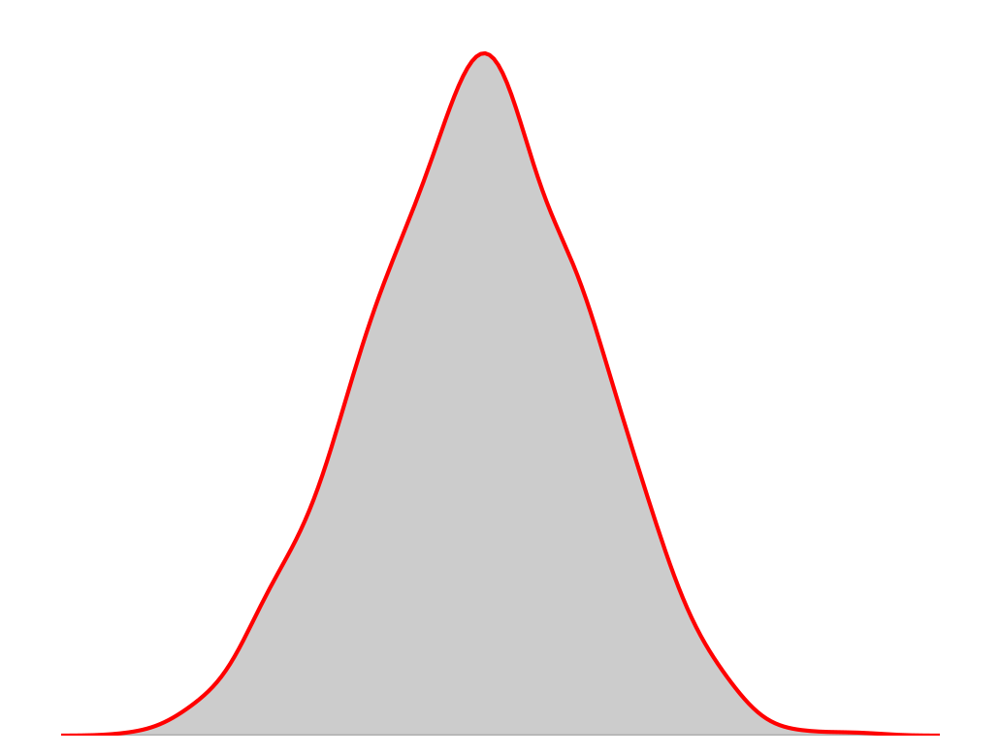

In [55]:
x_b = np.random.normal(20, 0.1, 1000)
ax = sns.distplot(x_b, color='gray', hist=False, kde_kws={'color': 'red'})
kde_x, kde_y = ax.lines[0].get_data()


ax.fill_between(kde_x, kde_y , 
                interpolate=True, color='gray', alpha=0.4)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels('')
ax.set_yticklabels('')
ax.set_xticks([])
ax.set_yticks([])

sns.despine(left=True, bottom=True)
plt.savefig("./figures/fig_si1_b1.pdf")


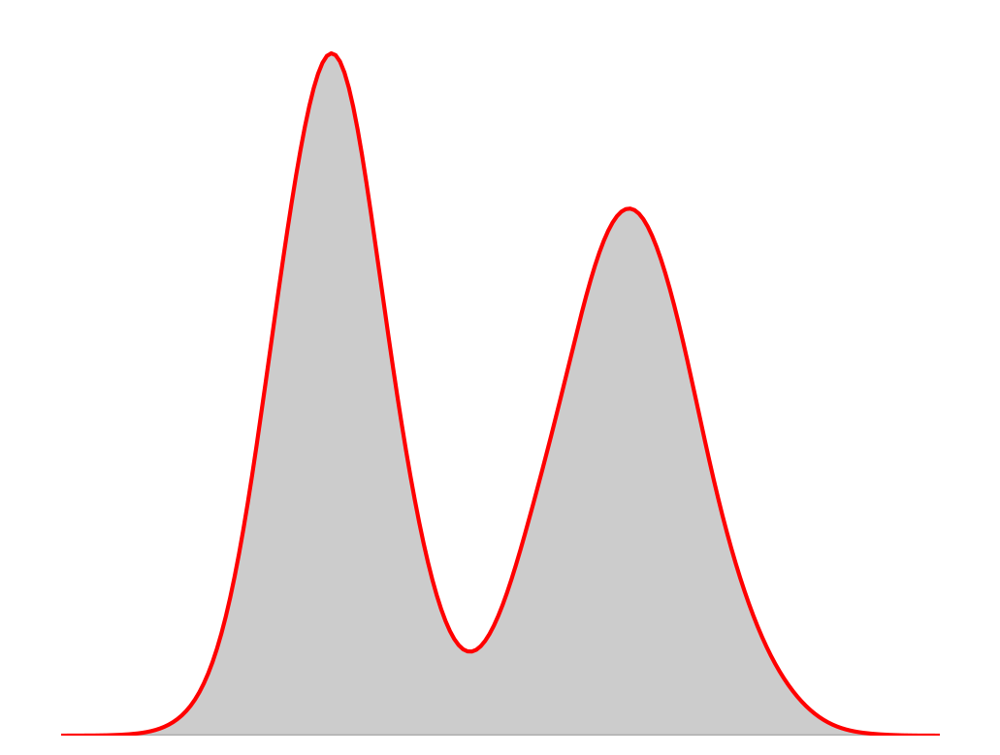

In [56]:
x_b = np.random.normal(20, 4, 10000)
x_a = np.random.normal(3, 3, 10000)

ax = sns.distplot(np.hstack((x_a,  x_b)), hist=False,color='gray', kde_kws={'color': 'red'})
kde_x, kde_y = ax.lines[0].get_data()


ax.fill_between(kde_x, kde_y , 
                interpolate=True, color='gray', alpha=0.4)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels('')
ax.set_yticklabels('')
ax.set_xticks([])
ax.set_yticks([])

sns.despine(left=True, bottom=True)

plt.savefig("./figures/fig_si1_b2.pdf")


In [74]:
dyn.cleanup(adata)

AnnData object with n_obs × n_vars = 5000 × 2
    obs: 'ntr', 'umap_ddhodge_div', 'umap_ddhodge_potential', 'control_point_umap', 'inlier_prob_umap', 'obs_vf_angle_umap', 'control_point_pca', 'inlier_prob_pca', 'obs_vf_angle_pca', 'pca_ddhodge_div', 'pca_ddhodge_potential', 'jacobian_det_umap', 'acceleration_pca', 'curvature_pca', 'curl_pca', 'divergence_pca', 'analytical_curvature', 'analytical_acceleration', 'analytical_curl', 'analytical_div'
    var: 'use_for_dynamics', 'velocity_gamma', 'gamma', 'gamma_b', 'use_for_transition', 'gamma_r2'
    uns: 'PCs', 'VecFld', 'VecFld_umap', 'dynamics', 'jacobian_true', 'jacobian_umap', 'VecFld_pca', 'neighbors', 'grid_acceleration_umap', 'grid_curvature_umap'
    obsm: 'X_true', 'X_umap', 'X_umap_SparseVFC', 'velocity_umap', 'velocity_umap_SparseVFC', 'X_pca', 'velocity_pca', 'velocity_pca_SparseVFC', 'X_pca_SparseVFC', 'acceleration_pca', 'acceleration_umap', 'curvature_pca', 'curvature_umap', 'curvature_pca_true', 'acceleration_pca_true', '

In [75]:
adata.write_h5ad('analytical_adata.h5ad')